In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from matplotlib.ticker import FuncFormatter
from unidecode import unidecode
from lifelines import KaplanMeierFitter
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

## Datos

In [2]:
dfDivorcios = pd.read_csv("../input/divorces.csv", sep = ";",  low_memory=False)
dfDivorcios.head()

,caprov_insc,cant_insc,parr_insc,anio_insc,mes_insc,dia_insc,fecha_insc,anio_div,mes_div,dia_div,...,fecha_nac2,edad_2,hijos_2,p_etnica2,niv_inst2,sabe_leer2,prov_hab2,cant_hab2,parr_hab2,area_2
0,Guayas,Guayaquil,Rocafuerte,2023,Enero,4,1/4/2023,2023,Enero,4,...,1973/12/16,49,0,Mestizo,Secundaria,Si,Guayas,Guayaquil,"Guayaquil, cabecera cantonal y capital provincial",Urbana
1,Guayas,Guayaquil,Rocafuerte,2023,Enero,3,1/3/2023,2022,Diciembre,20,...,1954/08/09,68,0,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Tarqui,Urbana
2,Guayas,Guayaquil,Rocafuerte,2023,Enero,3,1/3/2023,2020,Julio,14,...,1982/10/09,40,1,Mestizo,Superior Universitaria,Si,Guayas,Guayaquil,Tarqui,Urbana
3,Guayas,Guayaquil,Rocafuerte,2023,Enero,3,1/3/2023,2022,Diciembre,28,...,1950/03/20,72,0,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Tarqui,Urbana
4,Guayas,Guayaquil,Rocafuerte,2023,Enero,3,1/3/2023,2022,Diciembre,20,...,1979/01/17,43,1,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Tarqui,Urbana


In [3]:
dfMatrimonios = pd.read_csv("../input/inec_matrimonios_2023.csv", sep = ";", low_memory=False)
dfMatrimonios.head()

,prov_insc,cant_insc,parr_insc,anio_insc,mes_insc,dia_insc,fecha_insc,hijos_rec,mcap_bie,nac_1,...,edad_2,nmatant2,est_civi2,p_etnica2,niv_inst2,sabe_leer2,prov_hab2,cant_hab2,parr_hab2,area_2
0,Guayas,Guayaquil,Tarqui,2023,Enero,12,1/12/2023,3,No,Ecuatoriano,...,28,0,Soltero,Sin información,Ninguno,Sin información,Guayas,Guayaquil,Tarqui,Urbana
1,Guayas,Guayaquil,Tarqui,2023,Enero,14,1/14/2023,0,No,Ecuatoriano,...,31,0,Soltero,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Tarqui,Urbana
2,Guayas,Guayaquil,Tarqui,2023,Enero,14,1/14/2023,0,Sin información,Ecuatoriano,...,30,0,Soltero,Mestizo,Superior Universitaria,Si,Guayas,Guayaquil,Ximena,Urbana
3,Guayas,Guayaquil,Tarqui,2023,Enero,20,1/20/2023,0,No,Extranjero,...,40,1,Divorciado,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Pascuales,Urbana
4,Guayas,Guayaquil,Tarqui,2023,Enero,20,1/20/2023,0,No,Ecuatoriano,...,22,0,Soltero,Mestizo,Educación media / Bachillerato,Si,Guayas,Guayaquil,Pascuales,Urbana


In [4]:
dfPoblacion = pd.read_csv("../input/poblacion.csv", sep=",")
dfPoblacion

,Provincia,Cantón,Total,Hombres,Mujeres
0,Azuay,Cuenca,596101,281823,281823
1,Azuay,Girón,12182,5532,5532
2,Azuay,Gualaceo,43188,19421,19421
3,Azuay,Nabón,14776,6729,6729
4,Azuay,Paute,26782,12201,12201
...,...,...,...,...,...
239,Santo Domingo de los Tsáchilas,La Concordia,51386,25108,25108
240,Santa Elena,Total Santa Elena,385735,191303,191303
241,Santa Elena,Santa Elena,186687,93101,93101
242,Santa Elena,La Libertad,112247,54865,54865


In [5]:
dfPoblacion["Valor"] = dfPoblacion["Hombres"]
dfPoblacion["Complemento"] = dfPoblacion["Total"] - dfPoblacion["Hombres"]
# Se realiza esta acción bajo el supuesto de que hay más mujeres que hombres por cantón
dfPoblacion["Hombres"] = dfPoblacion[["Valor","Complemento"]].min(axis = 1)
dfPoblacion["Mujeres"] = dfPoblacion[["Valor","Complemento"]].max(axis = 1)
dfPoblacion.drop(columns=["Valor","Complemento"], inplace= True)
dfPoblacion.head()

,Provincia,Cantón,Total,Hombres,Mujeres
0,Azuay,Cuenca,596101,281823,314278
1,Azuay,Girón,12182,5532,6650
2,Azuay,Gualaceo,43188,19421,23767
3,Azuay,Nabón,14776,6729,8047
4,Azuay,Paute,26782,12201,14581


In [6]:
geo_df = gpd.read_file('../input/cantones-ecuador.geojson')
geo_df.head()

,DPA_VALOR,DPA_ANIO,DPA_CANTON,DPA_DESCAN,DPA_PROVIN,DPA_DESPRO,PCODE2,geometry
0,0,2011,0101,CUENCA,01,AZUAY,EC0101,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,0,2011,0102,GIRON,01,AZUAY,EC0102,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,0,2011,0103,GUALACEO,01,AZUAY,EC0103,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,0,2011,0104,NABON,01,AZUAY,EC0104,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,0,2011,0105,PAUTE,01,AZUAY,EC0105,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."


# Título: Probabilidad de Supervivencia Matrimonial en Ecuador

## Problema: ...

## Objetivo General: ...

## Analisis exploratorio de datos

In [7]:
tablaMatrimonios = pd.pivot_table(data=dfMatrimonios, index="cant_insc", values="fecha_insc",aggfunc="count")
tablaMatrimonios.reset_index(inplace=True)
tablaMatrimonios.rename(columns={"cant_insc":"Cantón","fecha_insc":"NumMat"}, inplace=True)
tablaMatrimonios

,Cantón,NumMat
0,Aguarico,11
1,Alausí,97
2,Alfredo Baquerizo Moreno (Juján),61
3,Ambato,1460
4,Antonio Ante,228
...,...,...
156,Yacuambí,1
157,Yantzaza (Yanzatza),110
158,Zamora,166
159,Zapotillo,37


In [8]:
tablaDivorcios = pd.pivot_table(data=dfDivorcios, index="cant_insc", values = "fecha_insc", aggfunc="count")
tablaDivorcios.reset_index(inplace=True)
tablaDivorcios.rename(columns={"cant_insc":"Cantón","fecha_insc":"NumDiv"}, inplace=True)
tablaDivorcios

,Cantón,NumDiv
0,Alausí,12
1,Ambato,242
2,Antonio Ante,69
3,Arenillas,44
4,Atacames,2
...,...,...
122,Valencia,17
123,Yantzaza (Yanzatza),58
124,Zamora,5
125,Zapotillo,14


In [9]:
tablaGeneral1 = pd.merge(dfPoblacion[["Provincia","Cantón","Total"]],tablaMatrimonios, on = "Cantón", how="left")
tablaGeneral1["NumMat"] = tablaGeneral1["NumMat"].fillna(0)

tablaGeneral1 = pd.merge(tablaGeneral1, tablaDivorcios, on ="Cantón", how="left")
tablaGeneral1["NumDiv"] = tablaGeneral1["NumDiv"].fillna(0)

# Tasa de Matrimonios
tablaGeneral1["TasaMat"] = (tablaGeneral1["NumMat"]/tablaGeneral1["Total"])*1000

tablaGeneral1['Cantón'] = tablaGeneral1['Cantón'].apply(lambda x: unidecode(x).upper())
tablaGeneral1["Provincia"] = tablaGeneral1["Provincia"].apply(lambda x: unidecode(x).upper())
tablaGeneral1

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655
1,AZUAY,GIRON,12182,71.0,39.0,5.828271
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292
3,AZUAY,NABON,14776,41.0,0.0,2.774770
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839
...,...,...,...,...,...,...
239,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703
240,SANTA ELENA,TOTAL SANTA ELENA,385735,0.0,0.0,0.000000
241,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276
242,SANTA ELENA,LA LIBERTAD,112247,0.0,0.0,0.000000


La **tasa de matrimonio**: Esta variable refleja cuántos matrimonios ocurren por cada 1000 personas en un cantón determinado. (Básicamente es una métrica para evaluar la frecuencia relativa de matrimonios por cantón).

¿Por qué es importante analizar la tasa de matrimonios?

Al analizar dónde se celebran más matrimonios en los distintos cantones de Ecuador, no basta con mirar simplemente el número total de matrimonios. Un cantón como Guayaquil, con una gran población, naturalmente tendrá más matrimonios en términos absolutos, pero esto no nos dice realmente cuán común es casarse en ese lugar comparado con un cantón más pequeño.

Para obtener una comparación justa y realmente entender en qué cantones el matrimonio es más frecuente, utilizamos la tasa de matrimonios. Esta tasa ajusta el número de matrimonios al tamaño de la población, dándonos una medida relativa que nos dice cuántos matrimonios ocurren por cada 1000 habitantes. Así, podemos identificar no solo dónde hay más matrimonios en números absolutos, sino en qué cantones la gente se casa con mayor frecuencia en relación con su población.

Este ajuste es crucial porque elimina el sesgo que podría introducir el tamaño de la población. Sin este ajuste, podríamos pensar erróneamente que un cantón con más habitantes es "más casamentero" simplemente porque tiene más gente, cuando en realidad, otro cantón más pequeño podría tener una cultura matrimonial más fuerte o ser un lugar donde casarse es mucho más común.

En resumen, al calcular la tasa de matrimonios, podemos hacer comparaciones más equitativas y descubrir los lugares donde realmente es más común que las personas decidan casarse, sin que el tamaño de la población distorsione nuestra percepción.

Observaciones iniciales con la Tabla General 1:

**Cuenca** en la provincia de Azuay tiene una tasa de matrimonios de aproximadamente 3.02 por cada 1000 habitantes, lo que indica una frecuencia moderada de matrimonios en comparación con otros cantones.

**Girón y Gualaceo** tienen tasas de matrimonios más altas, con 5.82 y 6.78 respectivamente, lo que sugiere que, proporcionalmente, hay más matrimonios en estos cantones en relación con su población.

In [10]:
tablaGeneral1.sort_values(by="TasaMat", ascending = False)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat
196,PICHINCHA,RUMINAHUI,107904,1223.0,270.0,11.334149
30,CANAR,SUSCAL,4627,47.0,0.0,10.157770
56,CHIMBORAZO,CUMANDA,16602,162.0,0.0,9.757860
24,CANAR,AZOGUES,74515,723.0,578.0,9.702744
55,CHIMBORAZO,PENIPE,6748,63.0,0.0,9.336100
...,...,...,...,...,...,...
104,GUAYAS,GENERAL ANTONIO ELIZALDE,11810,0.0,0.0,0.000000
105,GUAYAS,ISIDRO AYORA,14305,0.0,0.0,0.000000
106,IMBABURA,TOTAL IMBABURA,469879,0.0,0.0,0.000000
37,CARCHI,SAN PEDRO DE HUACA,7937,0.0,0.0,0.000000


In [11]:
# Tasa de Divorcios
tablaGeneral1["TasaDiv"] = (tablaGeneral1["NumDiv"] / tablaGeneral1["Total"]) * 1000

# Proporción de Divorcios respecto a Matrimonios (Es un factor que indica la incidencia de divorcios sobre la cantidad de matrimonios [más bien mide la incidencia de estos dos eventos])
tablaGeneral1["ProporcionDivMat"] = (tablaGeneral1["NumDiv"] / tablaGeneral1["NumMat"]) * 100
tablaGeneral1["ProporcionDivMat"] = tablaGeneral1["ProporcionDivMat"].fillna(0)
tablaGeneral1

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704
...,...,...,...,...,...,...,...,...
239,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703,0.486514,11.210762
240,SANTA ELENA,TOTAL SANTA ELENA,385735,0.0,0.0,0.000000,0.000000,0.000000
241,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276,0.776701,23.052464
242,SANTA ELENA,LA LIBERTAD,112247,0.0,0.0,0.000000,0.000000,0.000000


La **tasa de divorcio** mide cuántos divorcios hay por cada 1000 habitantes en un cantón. Es una forma estándar de entender qué tan común es el divorcio en relación con la población total del lugar. Nos permite comparar el número de divorcios entre cantones de diferentes tamaños de población, eliminando el sesgo que podría surgir si solo miramos el número absoluto de divorcios.

La **proporción de divorcios sobre matrimonios** calcula el porcentaje de divorcios en relación con el número de matrimonios registrados en el mismo año dentro de un cantón. No implica que los matrimonios y divorcios sean de las mismas parejas, sino que compara la incidencia de ambos eventos en un mismo periodo.

**Esta métrica ayuda a entender cómo se distribuyen los matrimonios y divorcios en un año específico dentro de cada cantón. Nos muestra la relación entre cuántos matrimonios y cuántos divorcios se registraron en un mismo año, lo que puede indicar, de manera general, la actividad matrimonial y de disolución matrimonial en cada cantón. Aunque no se relaciona con las mismas parejas, da una visión de cómo coexisten estos eventos en un mismo periodo.**

In [12]:
## En nuestra tabla general 1 existen cantones en los cuales no existe como tal un número de matrimonios o un número de divorcios mayor a 0. Por lo tanto
## estos cantones serán excluidos de los análisis posteriores para contar únicamente con 156 cantones.
tablaGeneral1[(tablaGeneral1["TasaDiv"]==0) & (tablaGeneral1["TasaMat"] == 0)]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
6,AZUAY,SAN FERNANDO,3738,0.0,0.0,0.0,0.0,0.0
8,AZUAY,SIGSIG,24992,0.0,0.0,0.0,0.0,0.0
10,AZUAY,CHORDELEG,12197,0.0,0.0,0.0,0.0,0.0
11,AZUAY,EL PAN,2776,0.0,0.0,0.0,0.0,0.0
12,AZUAY,SEVILLA DE ORO,4613,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
232,ORELLANA,TOTAL ORELLANA,182166,0.0,0.0,0.0,0.0,0.0
233,ORELLANA,FRANCISCO DE ORELLANA,95130,0.0,0.0,0.0,0.0,0.0
237,SANTO DOMINGO DE LOS TSACHILAS,TOTAL SANTO DOMINGO DE LOS TSACHILAS,492969,0.0,0.0,0.0,0.0,0.0
240,SANTA ELENA,TOTAL SANTA ELENA,385735,0.0,0.0,0.0,0.0,0.0


In [13]:
tablaGeneral1 = tablaGeneral1[~((tablaGeneral1["TasaDiv"]==0) & (tablaGeneral1["TasaMat"] == 0))]
tablaGeneral1.reset_index(drop = True, inplace= True)
tablaGeneral1

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704
...,...,...,...,...,...,...,...,...
151,ORELLANA,LORETO,27720,72.0,18.0,2.597403,0.649351,25.000000
152,SANTO DOMINGO DE LOS TSACHILAS,SANTO DOMINGO,441583,1537.0,645.0,3.480659,1.460654,41.964867
153,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703,0.486514,11.210762
154,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276,0.776701,23.052464


## BarPlot - Tasas de Matrimonios

In [14]:
tablaGeneral1.sort_values(by="TasaMat",ascending=False)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
128,PICHINCHA,RUMINAHUI,107904,1223.0,270.0,11.334149,2.502224,22.076860
19,CANAR,SUSCAL,4627,47.0,0.0,10.157770,0.000000,0.000000
39,CHIMBORAZO,CUMANDA,16602,162.0,0.0,9.757860,0.000000,0.000000
15,CANAR,AZOGUES,74515,723.0,578.0,9.702744,7.756827,79.944675
38,CHIMBORAZO,PENIPE,6748,63.0,0.0,9.336100,0.000000,0.000000
...,...,...,...,...,...,...,...,...
52,ESMERALDAS,MUISNE,36426,28.0,5.0,0.768682,0.137265,17.857143
119,MORONA SANTIAGO,TAISHA,26700,20.0,0.0,0.749064,0.000000,0.000000
7,AZUAY,ONA,3422,2.0,0.0,0.584454,0.000000,0.000000
124,PASTAZA,ARAJUNO,9553,5.0,0.0,0.523396,0.000000,0.000000


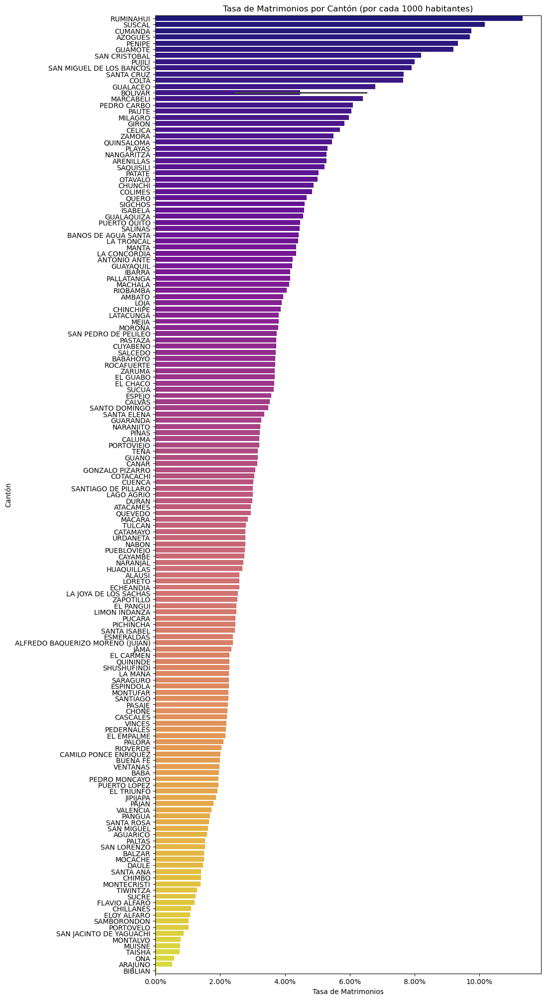

In [15]:
_= plt.figure(figsize=(10, 25))
_= sns.barplot(x="TasaMat",y = "Cantón" ,data=tablaGeneral1.sort_values(by="TasaMat", ascending=False), palette="plasma", legend=False, hue="Cantón")
_= plt.title('Tasa de Matrimonios por Cantón (por cada 1000 habitantes)')
_= plt.xlabel('Tasa de Matrimonios')
_= plt.ylabel('Cantón')
_= plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}%'))
_= plt.show()

**Cantones con Mayor Tasa de Matrimonios:**

Rumiñahui (Pichincha) se destaca con una tasa de matrimonios de 11.33 por cada 1000 habitantes, lo que indica una actividad matrimonial significativamente alta. Este cantón podría tener factores culturales o sociales que fomentan el matrimonio en su población.

Suscal (Cañar) y Cumandá (Chimborazo) también presentan tasas elevadas, con 10.16 y 9.76 por cada 1000 habitantes, respectivamente. Estos cantones, aunque pequeños en población, muestran una tendencia considerable hacia la formación de matrimonios.

**Cantones con Tasa Moderada de Matrimonios:**

Azogues (Cañar), con una tasa de 9.70 por cada 1000 habitantes, y Penipe (Chimborazo), con 9.33, están en el rango medio-alto. Aunque no son los más altos, estos cantones también muestran una actividad matrimonial significativa.

**Cantones con Menor Tasa de Matrimonios:**

Biblián (Cañar), con una tasa de 0.05 por cada 1000 habitantes, es uno de los cantones con la menor tasa de matrimonios. Esto podría sugerir que el matrimonio es mucho menos común en esta región, o que hay otros factores que limitan la formación de nuevas familias.
Arajuno (Pastaza) también presenta una baja tasa de matrimonios, con 0.52. Este cantón, situado en la Amazonía, podría estar influenciado por factores culturales o demográficos que resultan en una menor frecuencia de matrimonios.

**Patrones Regionales:** Los cantones con las tasas de matrimonios más altas tienden a estar en regiones de la Sierra, como Rumiñahui y Cumandá. Esto podría estar relacionado con tradiciones culturales más fuertes o una mayor estabilidad socioeconómica en esas áreas.

**Cantones con Baja Tasa:** Los cantones con tasas bajas, como Biblián y Arajuno, podrían requerir un análisis más profundo para entender por qué el matrimonio es menos común en estas regiones. Podría ser debido a factores como el acceso a servicios, diferencias culturales, o una mayor movilidad poblacional.

## BarPlot - Tasa de Divorcios

In [16]:
tablaGeneral1.sort_values(by="TasaDiv",ascending=False)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
15,CANAR,AZOGUES,74515,723.0,578.0,9.702744,7.756827,79.944675
141,GALAPAGOS,SAN CRISTOBAL,8300,68.0,51.0,8.192771,6.144578,75.000000
44,EL ORO,MARCABELI,6870,44.0,37.0,6.404658,5.385735,84.090909
143,GALAPAGOS,SANTA CRUZ,17233,132.0,92.0,7.659723,5.338595,69.696970
132,TUNGURAHUA,BANOS DE AGUA SANTA,21908,97.0,84.0,4.427606,3.834216,86.597938
...,...,...,...,...,...,...,...,...
105,MANABI,PAJAN,41879,75.0,0.0,1.790874,0.000000,0.000000
22,CARCHI,ESPEJO,14522,52.0,0.0,3.580774,0.000000,0.000000
101,MANABI,FLAVIO ALFARO,26415,32.0,0.0,1.211433,0.000000,0.000000
100,MANABI,EL CARMEN,120936,277.0,0.0,2.290468,0.000000,0.000000


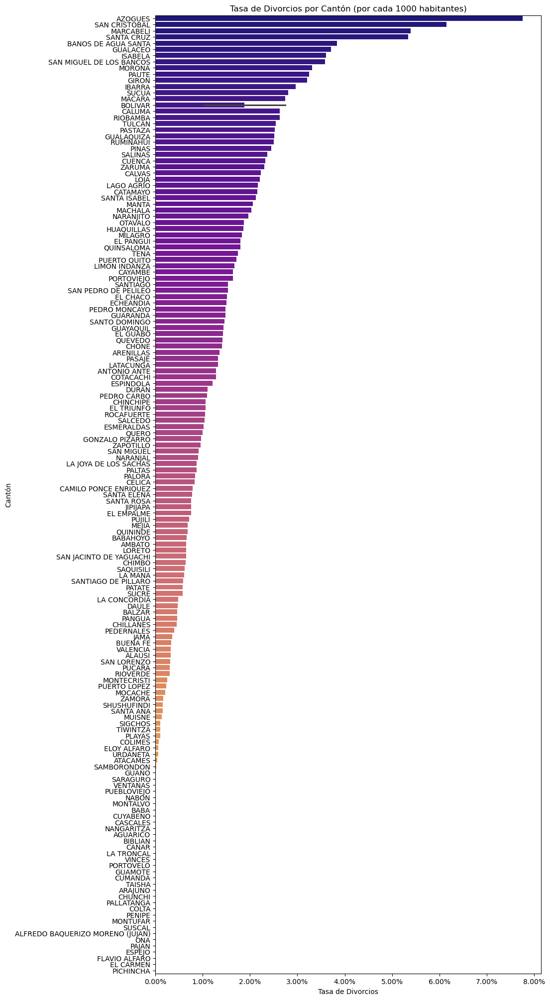

In [17]:
_= plt.figure(figsize=(10, 25))
_= sns.barplot(x="TasaDiv",y = "Cantón" ,data=tablaGeneral1.sort_values(by="TasaDiv", ascending=False), palette="plasma", legend=False, hue="Cantón")
_= plt.title('Tasa de Divorcios por Cantón (por cada 1000 habitantes)') ###
_= plt.xlabel('Tasa de Divorcios')
_= plt.ylabel('Cantón')
_= plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.2f}%'))
_= plt.show()

**Cantones con Mayor Tasa de Divorcios:**

Azogues (Cañar) encabeza la lista con una tasa de divorcios de 7.75 por cada 1000 habitantes. Esta alta tasa indica que, en relación con su población, Azogues tiene una incidencia significativa de divorcios, lo cual podría reflejar desafíos en la estabilidad matrimonial o condiciones sociales que favorecen la disolución de matrimonios.

San Cristóbal (Galápagos) y Marcabelí (El Oro) también muestran tasas elevadas, con 6.14 y 5.38 por cada 1000 habitantes, respectivamente. Estos cantones, aunque más pequeños en población, tienen una frecuencia notable de divorcios.

**Cantones con Tasa Moderada de Divorcios:**

Santa Cruz (Galápagos) presenta una tasa de divorcios de 5.33 por cada 1000 habitantes, lo que lo sitúa en un nivel moderadamente alto. Este cantón, en una región turística y de mayor movilidad, podría estar viendo un impacto de estas dinámicas en la estabilidad de los matrimonios.

Baños de Agua Santa (Tungurahua), conocido por ser un destino turístico, tiene una tasa de divorcios de 3.83 por cada 1000 habitantes, lo que también podría estar relacionado con la naturaleza transitoria o diversa de su población.

**Cantones con Baja Tasa de Divorcios:**

Cantones como Pajan (Manabí), Flavio Alfaro (Manabí), y Pichincha (Manabí) presentan tasas de divorcio extremadamente bajas (0.00 por cada 1000 habitantes). Esto podría sugerir una mayor estabilidad matrimonial o posiblemente subregistro de divorcios en estas áreas.

Espejo (Carchi) también muestra una tasa de divorcios baja, con 3.58 por cada 1000 habitantes, lo cual es relativamente bajo en comparación con los cantones en la parte superior de la lista.

**Patrones Regionales:** Cantones en la región de Galápagos y algunas áreas de la Sierra como Azogues y Baños de Agua Santa tienen tasas de divorcios relativamente altas. Esto podría estar influenciado por factores como el turismo, la movilidad de la población, o aspectos culturales específicos de estas áreas.
Baja Incidencia en Manabí: La provincia de Manabí muestra varios cantones con tasas de divorcio muy bajas o nulas, lo cual podría indicar una mayor estabilidad matrimonial o menos disoluciones formales registradas.

**Importancia de Factores Sociales y Económicos:** Las tasas de divorcio pueden estar reflejando factores sociales y económicos que varían de una región a otra. Cantones con mayor inestabilidad económica o social podrían ver un aumento en los divorcios, mientras que otros con comunidades más cohesionadas o con valores tradicionales más fuertes podrían tener tasas más bajas.

## Probabiliad de Supervivencia Matrimonial

In [18]:
tablaGeneral1 = tablaGeneral1.copy()

dfDivorcios['cant_insc'] = dfDivorcios['cant_insc'].apply(lambda x: unidecode(x).upper())

for canton in dfDivorcios['cant_insc'].unique().tolist():
    df_canton = dfDivorcios[dfDivorcios['cant_insc'] == canton]
    
    # Inicialización y ajuste del modelo Kaplan-Meier
    kmf = KaplanMeierFitter()
    kmf.fit(durations=df_canton['dur_mat'], event_observed= [True]*len(df_canton))
    
    # Probabilidad de supervivencia a 30 años
    prob_30_years = kmf.survival_function_at_times(30).values[0]
    tablaGeneral1.loc[tablaGeneral1['Cantón'] == canton, 'ProbSupervivencia'] = prob_30_years

tablaGeneral1

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954,0.088873
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577,0.230769
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509,0.106250
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000,NaN
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704,0.068966
...,...,...,...,...,...,...,...,...,...
151,ORELLANA,LORETO,27720,72.0,18.0,2.597403,0.649351,25.000000,0.166667
152,SANTO DOMINGO DE LOS TSACHILAS,SANTO DOMINGO,441583,1537.0,645.0,3.480659,1.460654,41.964867,0.088372
153,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703,0.486514,11.210762,0.120000
154,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276,0.776701,23.052464,0.117241


In [19]:
tablaGeneral1["ProbSupervivencia"] = tablaGeneral1["ProbSupervivencia"].fillna(0)
tablaGeneral1.sort_values(by = "ProbSupervivencia", ascending=False)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
90,LOS RIOS,URDANETA,33151,92.0,2.0,2.775180,0.060330,2.173913,0.500000
26,COTOPAXI,PANGUA,21867,37.0,10.0,1.692047,0.457310,27.027027,0.500000
52,ESMERALDAS,MUISNE,36426,28.0,5.0,0.768682,0.137265,17.857143,0.400000
134,TUNGURAHUA,QUERO,19084,89.0,19.0,4.663593,0.995598,21.348315,0.368421
138,ZAMORA CHINCHIPE,CHINCHIPE,10337,40.0,11.0,3.869595,1.064139,27.500000,0.363636
...,...,...,...,...,...,...,...,...,...
35,CHIMBORAZO,GUAMOTE,35769,329.0,0.0,9.197909,0.000000,0.000000,0.000000
38,CHIMBORAZO,PENIPE,6748,63.0,0.0,9.336100,0.000000,0.000000,0.000000
124,PASTAZA,ARAJUNO,9553,5.0,0.0,0.523396,0.000000,0.000000,0.000000
87,LOS RIOS,MONTALVO,28354,22.0,0.0,0.775905,0.000000,0.000000,0.000000


Si un cantón tiene muy pocos divorcios registrados o ninguno, el modelo de Kaplan-Meier puede no tener suficiente información para calcular una función de supervivencia significativa. Esto puede ocurrir en cantones con poblaciones muy pequeñas o donde la incidencia de divorcios es extremadamente baja.

En cantones donde no hay registros de divorcios (NumDiv = 0), no se puede calcular una probabilidad de supervivencia basada en divorcios, lo que resultará en un valor NaN.

In [20]:
tablaGeneral1[(tablaGeneral1["TasaDiv"] > 0) & (tablaGeneral1["TasaMat"] > 0) & (tablaGeneral1["ProbSupervivencia"] > 0)]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954,0.088873
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577,0.230769
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509,0.106250
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704,0.068966
6,AZUAY,SANTA ISABEL,20753,51.0,44.0,2.457476,2.120175,86.274510,0.136364
...,...,...,...,...,...,...,...,...,...
151,ORELLANA,LORETO,27720,72.0,18.0,2.597403,0.649351,25.000000,0.166667
152,SANTO DOMINGO DE LOS TSACHILAS,SANTO DOMINGO,441583,1537.0,645.0,3.480659,1.460654,41.964867,0.088372
153,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703,0.486514,11.210762,0.120000
154,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276,0.776701,23.052464,0.117241


En este análisis, he decidido no tomar en consideración aquellos cantones donde la tasa de matrimonios o la tasa de divorcios es igual a cero, o donde la probabilidad de supervivencia no pudo ser calculada. La exclusión de estos cantones es crucial para garantizar que los datos utilizados sean robustos y representativos, lo que es especialmente importante para los siguientes pasos del análisis, como la aplicación del algoritmo K-means para identificar grupos significativos de cantones. Además, al construir un modelo de predicción o clasificación, es esencial trabajar con datos completos y confiables para evitar que las predicciones se vean afectadas por información insuficiente o errónea. Al filtrar estos cantones, aseguro que tanto el análisis de clustering como los modelos predictivos se basen en datos que reflejen de manera precisa las dinámicas matrimoniales y de divorcio en Ecuador, lo que, en última instancia, llevará a conclusiones más válidas y aplicables.

In [21]:
geo_df.head()

,DPA_VALOR,DPA_ANIO,DPA_CANTON,DPA_DESCAN,DPA_PROVIN,DPA_DESPRO,PCODE2,geometry
0,0,2011,0101,CUENCA,01,AZUAY,EC0101,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,0,2011,0102,GIRON,01,AZUAY,EC0102,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,0,2011,0103,GUALACEO,01,AZUAY,EC0103,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,0,2011,0104,NABON,01,AZUAY,EC0104,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,0,2011,0105,PAUTE,01,AZUAY,EC0105,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."


In [22]:
map_data = tablaGeneral1.merge(geo_df[["DPA_DESCAN","DPA_DESPRO","geometry"]], left_on=["Cantón","Provincia"], right_on=["DPA_DESCAN","DPA_DESPRO"], how = "left")
map_data

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,DPA_DESCAN,DPA_DESPRO,geometry
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954,0.088873,CUENCA,AZUAY,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577,0.230769,GIRON,AZUAY,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509,0.106250,GUALACEO,AZUAY,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000,0.000000,NABON,AZUAY,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704,0.068966,PAUTE,AZUAY,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
151,ORELLANA,LORETO,27720,72.0,18.0,2.597403,0.649351,25.000000,0.166667,LORETO,ORELLANA,"MULTIPOLYGON (((-77.12450 -0.69513, -77.12710 ..."
152,SANTO DOMINGO DE LOS TSACHILAS,SANTO DOMINGO,441583,1537.0,645.0,3.480659,1.460654,41.964867,0.088372,SANTO DOMINGO,SANTO DOMINGO DE LOS TSACHILAS,"MULTIPOLYGON (((-79.16894 -0.01525, -79.16685 ..."
153,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,4.339703,0.486514,11.210762,0.120000,NaN,NaN,None
154,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,3.369276,0.776701,23.052464,0.117241,SANTA ELENA,SANTA ELENA,"MULTIPOLYGON (((-80.78429 -1.93628, -80.78629 ..."


In [23]:
map_data[map_data["DPA_DESCAN"].isna()]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,DPA_DESCAN,DPA_DESPRO,geometry
7,AZUAY,ONA,3422,2.0,0.0,0.584454,0.000000,0.000000,0.000000,NaN,NaN,None
15,CANAR,AZOGUES,74515,723.0,578.0,9.702744,7.756827,79.944675,0.121107,NaN,NaN,None
16,CANAR,BIBLIAN,18852,1.0,0.0,0.053045,0.000000,0.000000,0.000000,NaN,NaN,None
17,CANAR,CANAR,52150,164.0,0.0,3.144775,0.000000,0.000000,0.000000,NaN,NaN,None
18,CANAR,LA TRONCAL,62103,274.0,0.0,4.412025,0.000000,0.000000,0.000000,NaN,NaN,None
19,CANAR,SUSCAL,4627,47.0,0.0,10.157770,0.000000,0.000000,0.000000,NaN,NaN,None
46,EL ORO,PINAS,29406,95.0,72.0,3.230633,2.448480,75.789474,0.152778,NaN,NaN,None
58,GUAYAS,ALFREDO BAQUERIZO MORENO (JUJAN),25526,61.0,0.0,2.389720,0.000000,0.000000,0.000000,NaN,NaN,None
63,GUAYAS,EL EMPALME,79767,173.0,60.0,2.168817,0.752191,34.682081,0.133333,NaN,NaN,None
128,PICHINCHA,RUMINAHUI,107904,1223.0,270.0,11.334149,2.502224,22.076860,0.107407,NaN,NaN,None


Para la creación del Mapa Coroplético, es fundamental contar con la representación geográfica de cada cantón en el archivo GeoJSON. Sin embargo, hemos identificado que algunos cantones presentes en el análisis no tienen datos geográficos correspondientes en el GeoJSON, lo que impide su inclusión en el mapa. 

Dado que el objetivo es visualizar la distribución espacial de la probabilidad de supervivencia matrimonial, estos cantones no pueden ser considerados en el mapa. La exclusión de estos cantones asegura que el mapa coroplético sea preciso y visualmente coherente, permitiendo una interpretación clara y efectiva de los resultados para aquellos cantones con información geográfica disponible.

In [24]:
map_data = map_data[~(map_data["DPA_DESCAN"].isna())]

In [25]:
map_data.head()

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,DPA_DESCAN,DPA_DESPRO,geometry
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954,0.088873,CUENCA,AZUAY,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577,0.230769,GIRON,AZUAY,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509,0.106250,GUALACEO,AZUAY,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000,0.000000,NABON,AZUAY,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704,0.068966,PAUTE,AZUAY,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."


In [26]:
map_data = gpd.GeoDataFrame(map_data)

In [27]:
map_data['centroid'] = map_data.geometry.centroid
map_data['Latitud'] = map_data['centroid'].y
map_data['Longitud'] = map_data['centroid'].x
map_data.head()

/var/folders/4q/ztrdsrt11lb2gp5qg6j75vh80000gn/T/ipykernel_33301/3147518585.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_data['centroid'] = map_data.geometry.centroid


,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,DPA_DESCAN,DPA_DESPRO,geometry,centroid,Latitud,Longitud
0,AZUAY,CUENCA,596101,1803.0,1384.0,3.024655,2.321754,76.760954,0.088873,CUENCA,AZUAY,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ...",POINT (-79.21998 -2.86144),-2.861444,-79.219981
1,AZUAY,GIRON,12182,71.0,39.0,5.828271,3.201445,54.929577,0.230769,GIRON,AZUAY,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ...",POINT (-79.15930 -3.17951),-3.179508,-79.159305
2,AZUAY,GUALACEO,43188,293.0,160.0,6.784292,3.704733,54.607509,0.106250,GUALACEO,AZUAY,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ...",POINT (-78.77648 -2.91865),-2.918647,-78.776475
3,AZUAY,NABON,14776,41.0,0.0,2.774770,0.000000,0.000000,0.000000,NABON,AZUAY,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ...",POINT (-79.11899 -3.32973),-3.329730,-79.118988
4,AZUAY,PAUTE,26782,162.0,87.0,6.048839,3.248450,53.703704,0.068966,PAUTE,AZUAY,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ...",POINT (-78.74181 -2.75341),-2.753414,-78.741811


In [28]:
map_data = map_data.to_crs(epsg=4326)

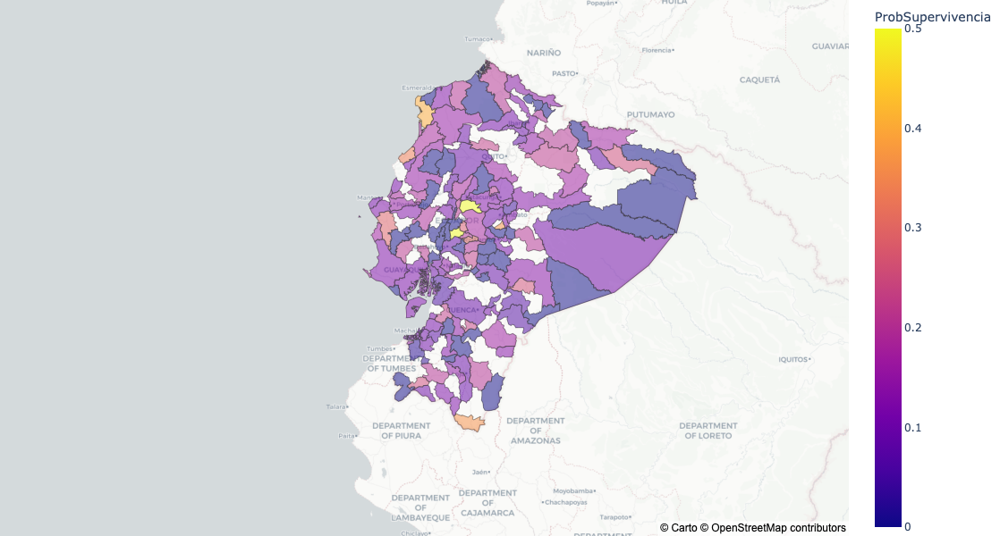

In [29]:
## Mapa coroplético
fig = px.choropleth_mapbox(
    map_data,
    geojson = map_data.geometry,
    locations = map_data.index,
    color = "ProbSupervivencia",
    hover_name = "Cantón",
    mapbox_style = "carto-positron",
    center = {"lat": -2.17, "lon": -79.94},
    zoom = 5.5,  
    opacity = 0.5,
    color_continuous_scale = "Plasma",  
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    autosize = False,
    margin = dict(l=0, r=0, b=0, t=0, pad=4),
    width = 1400,
    height = 600
)

fig.show()

In [30]:
tablaGeneral1.sort_values(by="ProbSupervivencia", ascending=False).head(10)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
90,LOS RIOS,URDANETA,33151,92.0,2.0,2.775180,0.060330,2.173913,0.500000
26,COTOPAXI,PANGUA,21867,37.0,10.0,1.692047,0.457310,27.027027,0.500000
52,ESMERALDAS,MUISNE,36426,28.0,5.0,0.768682,0.137265,17.857143,0.400000
134,TUNGURAHUA,QUERO,19084,89.0,19.0,4.663593,0.995598,21.348315,0.368421
138,ZAMORA CHINCHIPE,CHINCHIPE,10337,40.0,11.0,3.869595,1.064139,27.500000,0.363636
112,MANABI,JAMA,16588,39.0,6.0,2.351097,0.361707,15.384615,0.333333
11,BOLIVAR,CHIMBO,15524,22.0,10.0,1.417161,0.644164,45.454545,0.300000
102,MANABI,JIPIJAPA,78117,146.0,59.0,1.868991,0.755277,40.410959,0.288136
12,BOLIVAR,ECHEANDIA,14654,38.0,22.0,2.593149,1.501297,57.894737,0.272727
118,MORONA SANTIAGO,SUCUA,23504,86.0,66.0,3.658952,2.808033,76.744186,0.257576


El análisis de la probabilidad de supervivencia matrimonial en los cantones de Ecuador, utilizando la función de supervivencia de Kaplan-Meier, revela una notable variabilidad en la estabilidad matrimonial a lo largo del país. Los resultados, visualizados mediante el mapa coroplético, permiten identificar patrones y diferencias significativas en la longevidad de los matrimonios según la región.

En términos generales, la probabilidad de que un matrimonio supere los 30 años oscila ampliamente entre los cantones. Por ejemplo, cantones como Urdaneta en la provincia de Los Ríos y Pangua en Cotopaxi muestran probabilidades de supervivencia del 50%. Esto sugiere que, estadísticamente, en estos cantones la mitad de los matrimonios podrían durar más de tres décadas, lo cual es indicativo de una alta estabilidad matrimonial. En estos casos, la función de supervivencia alcanza un valor relativamente alto, lo que puede estar asociado con factores culturales, sociales o económicos que favorecen la longevidad de las uniones matrimoniales.

Por otro lado, existen cantones donde la probabilidad de supervivencia es considerablemente más baja. Cantones como Jama en Manabí y Sucua en Morona Santiago presentan probabilidades de supervivencia matrimonial que rondan el 27% al 33%. Estas cifras indican que, en estas localidades, es menos probable que los matrimonios perduren a largo plazo, reflejando tal vez la presencia de factores que contribuyen a una mayor tasa de disolución matrimonial. La distribución geográfica de estas probabilidades muestra que no existe una concentración clara en una región específica, sino que las diferencias son notorias incluso entre cantones vecinos, lo que sugiere que las dinámicas matrimoniales son altamente contextuales y pueden depender de variables locales específicas.

El análisis estadístico pone de manifiesto que las zonas rurales parecen tener una ligera tendencia hacia una mayor probabilidad de supervivencia matrimonial en comparación con las áreas urbanas más grandes, aunque esto no es una regla estricta. Esto podría estar relacionado con diferencias en las estructuras sociales, niveles de urbanización, y tal vez una mayor presión social para mantener los matrimonios en regiones menos urbanizadas.

## 3D-Scatter Plot

In [31]:
## Estandarización
variables = ['TasaMat', 'TasaDiv', 'ProbSupervivencia']

scaler = StandardScaler()
tablaGeneral1_std = tablaGeneral1.copy()
tablaGeneral1_std[variables] = scaler.fit_transform(tablaGeneral1_std[variables])
tablaGeneral1_std

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
0,AZUAY,CUENCA,596101,1803.0,1384.0,-0.208266,0.914375,76.760954,-0.240066
1,AZUAY,GIRON,12182,71.0,39.0,1.151181,1.600542,54.929577,1.199933
2,AZUAY,GUALACEO,43188,293.0,160.0,1.614747,1.993110,54.607509,-0.063718
3,AZUAY,NABON,14776,41.0,0.0,-0.329434,-0.896613,0.000000,-1.141969
4,AZUAY,PAUTE,26782,162.0,87.0,1.258132,1.637206,53.703704,-0.442090
...,...,...,...,...,...,...,...,...,...
151,ORELLANA,LORETO,27720,72.0,18.0,-0.415437,-0.390114,25.000000,0.549405
152,SANTO DOMINGO DE LOS TSACHILAS,SANTO DOMINGO,441583,1537.0,645.0,0.012846,0.242710,41.964867,-0.245147
153,SANTO DOMINGO DE LOS TSACHILAS,LA CONCORDIA,51386,223.0,25.0,0.429388,-0.517128,11.210762,0.075820
154,SANTA ELENA,SANTA ELENA,186687,629.0,145.0,-0.041163,-0.290779,23.052464,0.047825


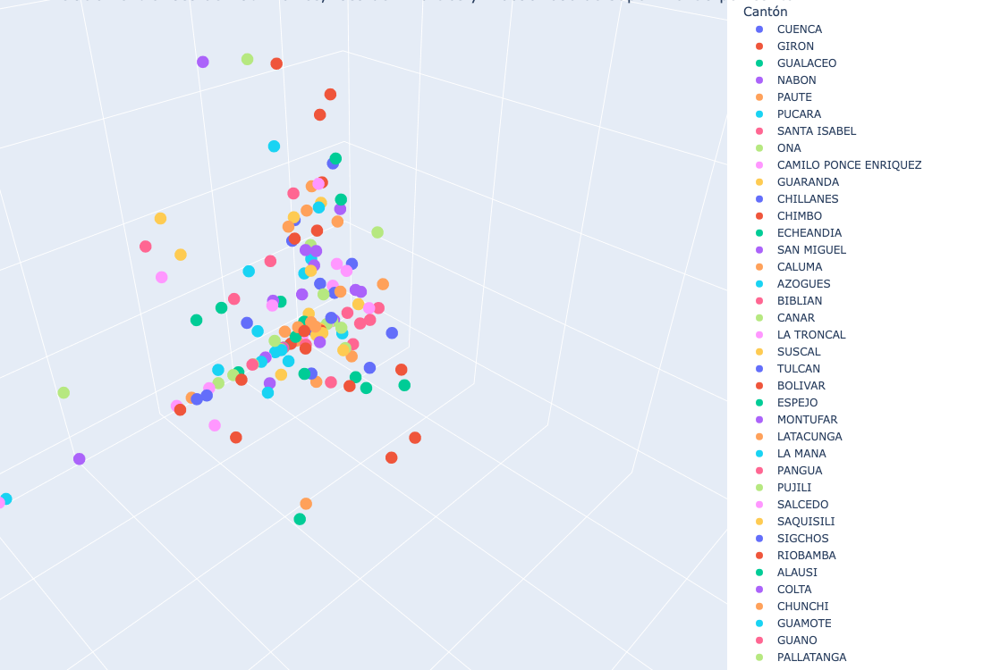

In [32]:
fig = px.scatter_3d(
    tablaGeneral1_std,
    x='TasaMat',  # Eje X - Tasa de Matrimonios
    y='TasaDiv',  # Eje Y - Tasa de Divorcios
    z='ProbSupervivencia',  # Eje Z - Probabilidad de Supervivencia
    color='Cantón',
    hover_name='Cantón',
    labels={
        'TasaMat': 'Tasa de Matrimonios',
        'TasaDiv': 'Tasa de Divorcios',
        'ProbSupervivencia': 'Probabilidad de Supervivencia'
    },
    title='Relación entre Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia por Cantón'
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

**Concentración de Cantones:**

La mayoría de las observaciones en el gráfico se concentran en una región cercana al origen, lo que indica que muchos cantones tienen valores relativamente bajos en términos de tasa de matrimonios, tasa de divorcios y probabilidad de supervivencia. Esto sugiere que, en general, no hay una tendencia fuerte hacia tasas extremadamente altas o bajas en estas variables dentro del conjunto de cantones.

La concentración de puntos en la base del gráfico, alrededor de valores bajos para las tres variables, podría indicar que muchos cantones comparten características similares en cuanto a la estabilidad y disolución matrimonial.

**Cantones con Valores Extremos:**

Algunos cantones se destacan por estar ubicados en posiciones alejadas del grupo principal de puntos. Estos cantones representan situaciones extremas donde una o más de las variables tienen valores significativamente altos o bajos. Por ejemplo, cantones en la parte superior derecha del gráfico tienen altas tasas de matrimonios y divorcios, lo que podría indicar una alta movilidad matrimonial, donde los matrimonios ocurren con frecuencia pero también se disuelven rápidamente.

Cantones con una alta probabilidad de supervivencia (en el eje Z) combinada con una baja tasa de divorcios (en el eje Y) y una tasa de matrimonios moderada (en el eje X) indican una estabilidad matrimonial superior a la media. Estos cantones pueden ser representativos de regiones donde las uniones matrimoniales son más duraderas y menos propensas a la disolución.

**Interacción entre Variables:**

La distribución de las observaciones sugiere una relación negativa entre la tasa de divorcios y la probabilidad de supervivencia matrimonial, lo cual es intuitivo: a medida que aumenta la tasa de divorcios, es menos probable que los matrimonios sobrevivan a largo plazo.

La relación entre la tasa de matrimonios y la tasa de divorcios parece ser más compleja. En algunos cantones, una alta tasa de matrimonios coincide con una alta tasa de divorcios, lo que podría indicar que los matrimonios se forman y disuelven con mayor frecuencia. Sin embargo, en otros cantones, una alta tasa de matrimonios se asocia con una baja tasa de divorcios, lo que sugiere una mayor estabilidad matrimonial.

## Matriz de correlaciones

En el contexto de nuestro análisis, K-means será utilizada para identificar patrones ocultos en los datos relacionados con la tasa de matrimonios, la tasa de divorcios y la probabilidad de supervivencia matrimonial en diferentes cantones de Ecuador. Al aplicar K-means, podemos agrupar los cantones en clusters que compartan características similares en estas tres dimensiones, lo que puede proporcionar una nueva perspectiva sobre la estabilidad matrimonial en diferentes regiones.

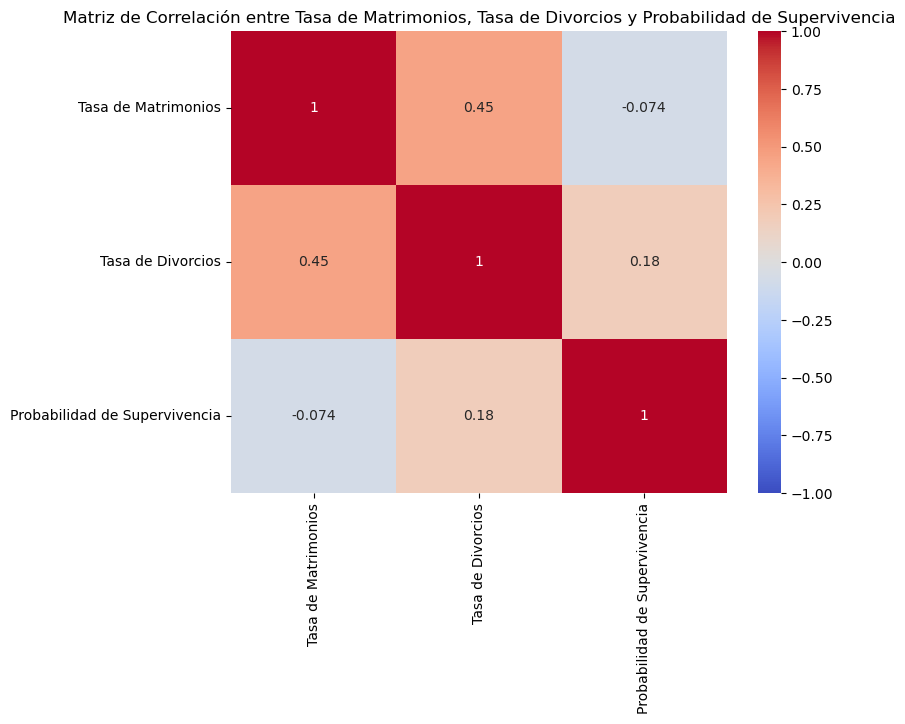

In [33]:
# Análisis de Correlación
correlation_matrix = tablaGeneral1_std[['TasaMat', 'TasaDiv', 'ProbSupervivencia']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1,
             xticklabels=['Tasa de Matrimonios', 'Tasa de Divorcios', 'Probabilidad de Supervivencia'],
            yticklabels=['Tasa de Matrimonios', 'Tasa de Divorcios', 'Probabilidad de Supervivencia'])
plt.title('Matriz de Correlación entre Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia')
plt.show()

Al analizar la matriz de correlación, observo que las correlaciones entre las variables `TasaMat` (tasa de matrimonios), `TasaDiv` (tasa de divorcios), y `ProbSupervivencia` (probabilidad de supervivencia) son relativamente bajas. Específicamente, la correlación más alta se da entre la `TasaMat` y la `TasaDiv`, con un valor de 0.45, lo que indica una relación moderada. Sin embargo, esta correlación no es lo suficientemente alta como para justificar eliminar alguna de las variables del análisis.

Por otro lado, la correlación entre `TasaMat` y `ProbSupervivencia` es casi inexistente (-0.074), lo que sugiere que estas dos variables son prácticamente independientes. Igualmente, la correlación entre `TasaDiv` y `ProbSupervivencia` es baja (0.18), indicando una relación muy débil.

Dado que ninguna de las correlaciones es suficientemente alta para considerar que las variables están midiendo lo mismo, creo que es válido utilizar las tres variables en el análisis de K-means. Esto nos permitirá capturar la mayor cantidad de información posible sobre los diferentes aspectos de la estabilidad matrimonial en los cantones. Por lo tanto, me quedaré con las tres variables (`TasaMat`, `TasaDiv`, y `ProbSupervivencia`) para proceder con el análisis de clustering.

## Análisis de Silueta

Para n_clusters = 2, el promedio de silueta es: 0.27704526207493546
Para n_clusters = 3, el promedio de silueta es: 0.29891766709815076
Para n_clusters = 4, el promedio de silueta es: 0.35571688965002946
Para n_clusters = 5, el promedio de silueta es: 0.37759421601244336
Para n_clusters = 6, el promedio de silueta es: 0.36038425715793354
Para n_clusters = 7, el promedio de silueta es: 0.38000049661955754


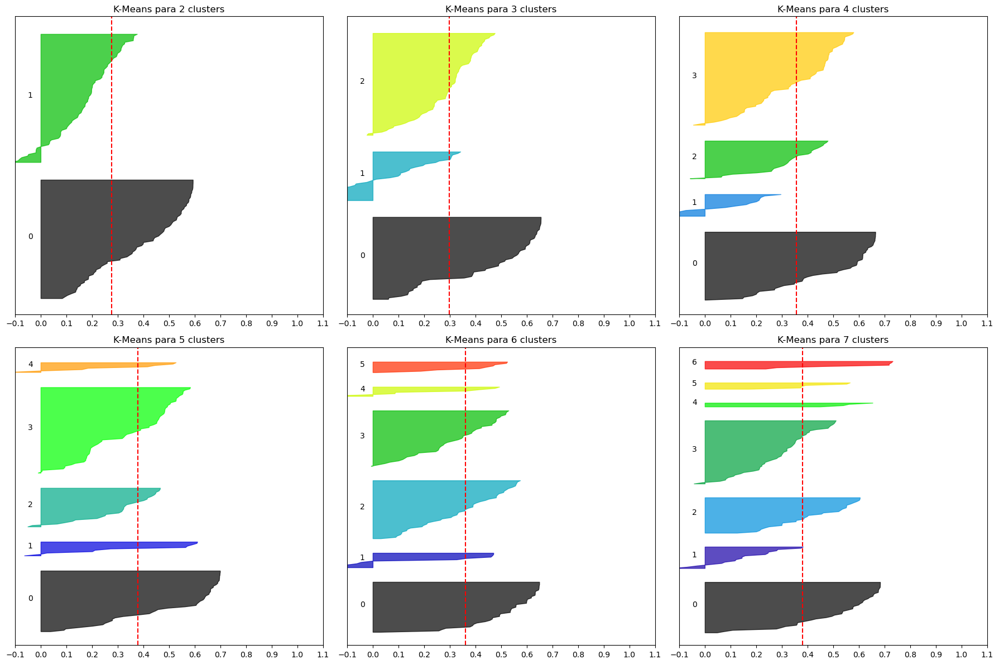

In [34]:
# Datos estandarizados
X = tablaGeneral1_std[['TasaMat', 'TasaDiv', 'ProbSupervivencia']].values

# Rango de clusters que se evaluarán
range_n_clusters = range(2, 8)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, n_clusters in enumerate(range_n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(f"Para n_clusters = {n_clusters}, el promedio de silueta es: {silhouette_avg}")
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    ax = axes[idx]
    ax.set_xlim([-0.1, 1])
    ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)
        
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        
        y_lower = y_upper + 10

    ax.set_title(f"K-Means para {n_clusters} clusters")
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_yticks([]) 
    ax.set_xticks(np.arange(-0.1, 1.1, 0.1))

plt.tight_layout()
plt.show()

Al analizar los gráficos de silueta y los valores de las puntuaciones promedio de silueta para diferentes números de clusters, podemos hacer las siguientes observaciones:

n_clusters = 2: La puntuación de silueta es relativamente baja (0.277). Aunque agrupar en dos clusters puede ser una opción sencilla, la baja puntuación sugiere que los grupos no están bien definidos, con mucha superposición entre los puntos.

n_clusters = 3: Con un aumento en la puntuación a 0.299, vemos una ligera mejora, pero sigue siendo relativamente baja. Esto sugiere que, aunque se están formando más grupos, la definición entre ellos sigue siendo poco clara.

n_clusters = 4: Aquí, la puntuación de silueta aumenta notablemente a 0.356. Los gráficos también muestran una mejor separación entre los clusters, lo que indica que este podría ser un buen punto de equilibrio entre simplicidad y claridad en la segmentación.

n_clusters = 5: La puntuación sube a 0.378, lo que sugiere una mejora adicional en la separación de los clusters. Sin embargo, la diferencia en la puntuación con respecto a 4 clusters no es muy significativa, y podríamos estar empezando a ver una fragmentación innecesaria.

n_clusters = 6 y 7: Aunque la puntuación sigue aumentando ligeramente (con 0.360 para 6 clusters y 0.380 para 7 clusters), la diferencia en la puntuación es mínima en comparación con los clusters anteriores. Los gráficos de silueta también muestran algunos clusters con menos consistencia, lo que puede dificultar la interpretación.

**Conclusión y Elección del Número de Clusters:**

Dado que el objetivo es lograr una buena separación entre clusters sin complicar demasiado la interpretación, y considerando tu preferencia por 4 clusters, parece razonable elegir n_clusters = 4. Este número ofrece una clara mejora en la calidad de los clusters en comparación con los valores menores de 𝑛, mientras que evita la sobrefragmentación que podría ocurrir con 𝑛 = 5 o más.

## Implementación del K-Means

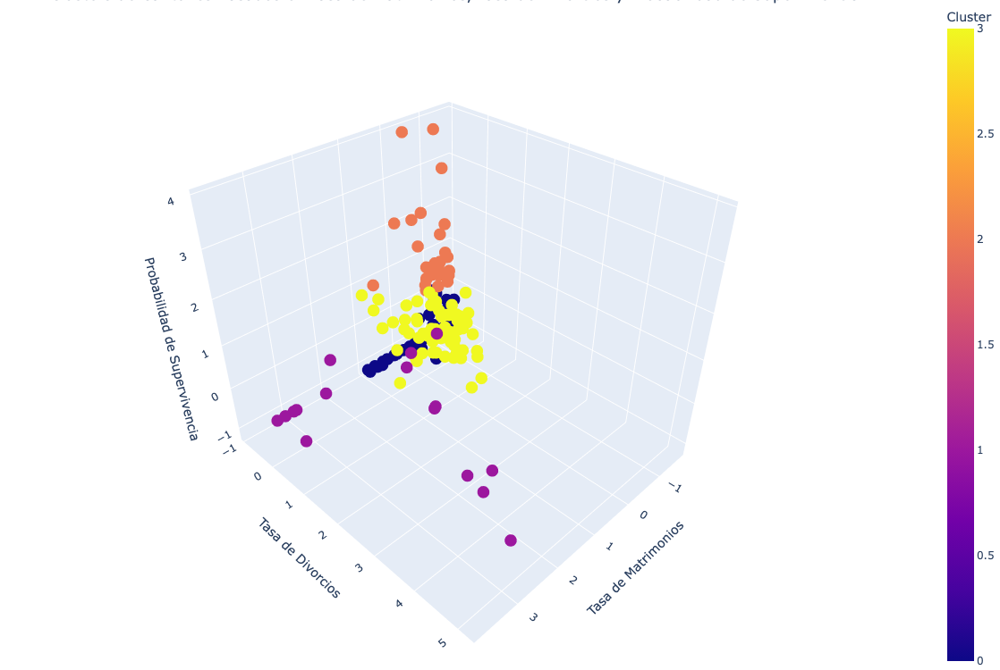

In [35]:
kmeans = KMeans(n_clusters=4, random_state=42)
tablaGeneral1_std['Cluster'] = kmeans.fit_predict(tablaGeneral1_std[['TasaMat', 'TasaDiv', 'ProbSupervivencia']])

fig = px.scatter_3d(
    tablaGeneral1_std,
    x='TasaMat',
    y='TasaDiv',
    z='ProbSupervivencia',
    color='Cluster',
    hover_name='Cantón',
    title='Clusters de Cantones Basados en Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia',
    labels={'TasaMat': 'Tasa de Matrimonios', 'TasaDiv': 'Tasa de Divorcios', 'ProbSupervivencia': 'Probabilidad de Supervivencia'}
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

**Cluster 0 [Grupo Azul]:**

Este clúster se caracteriza por tener cantones con bajas tasas de matrimonio, bajas tasas de divorcio y bajas probabilidades de supervivencia matrimonial. Estas características sugieren que en estos cantones los matrimonios son menos comunes y tienen menos posibilidades de durar en comparación con otros clústeres. Podría estar relacionado con regiones con menos población o con menos dinámicas sociales en torno al matrimonio. En este grupo se encuentran cantones como: Nabon, Pucara, Ona, Atacames, Santa Rosa, Montalvo, Vinces, en este grupo hay mayormente cantones de la Costa.

**Cluster 1 [Grupo Morado]:**

Los cantones en este clúster muestran una mayor tasa de matrimonios que los del Clúster 0, pero las tasas de divorcio son moderadas a bajas. La probabilidad de supervivencia también es relativamente baja, pero no tanto como en el Clúster 0. Esto podría representar regiones donde el matrimonio es más común, pero donde aún se observan desafíos en la durabilidad de estos matrimonios. En este grupo se encuentran cantones como: Giron, Gualaceo, Azogues, Rumiñahui, Santa Cruz,  en este grupo hay mayormente cantones de la Sierra.

**Cluster 2 [Grupo Naranja]:**

Este clúster destaca por tener tasas de matrimonios y probabilidades de supervivencia relativamente más altas en comparación con los dos primeros clústeres. Las tasas de divorcio en este grupo también son variadas, pero generalmente más bajas. Estos cantones podrían representar áreas con una cultura más fuerte del matrimonio, donde es más probable que los matrimonios perduren.  En este grupo se encuentran cantones como: CHILLANES, BALZAR, JIPIJAPA, CHINCHIPE
**Cluster 3 [Grupo Amarillo]:**

El Clúster 3 incluye cantones con las tasas más altas tanto de matrimonios como de divorcios, junto con probabilidades de supervivencia más altas. Esto indica regiones donde el matrimonio es muy común, pero donde también se observa una alta incidencia de divorcios. Es probable que en estas áreas haya dinámicas sociales intensas relacionadas con el matrimonio, y aunque muchas personas se casan, también hay una alta probabilidad de divorcio. En este grupo se encuentran cantones como: ESMERALDAS, GUAYAQUIL, LOJA, PUERTO QUITO

In [36]:
tablaGeneral1_std[tablaGeneral1_std["Cluster"] == 0]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
3,AZUAY,NABON,14776,41.0,0.0,-0.329434,-0.896613,0.000000,-1.141969,0
5,AZUAY,PUCARA,9693,24.0,3.0,-0.474298,-0.655199,12.500000,-1.141969,0
7,AZUAY,ONA,3422,2.0,0.0,-1.391498,-0.896613,0.000000,-1.141969,0
16,CANAR,BIBLIAN,18852,1.0,0.0,-1.649173,-0.896613,0.000000,-1.141969,0
17,CANAR,CANAR,52150,164.0,0.0,-0.150022,-0.896613,0.000000,-1.141969,0
18,CANAR,LA TRONCAL,62103,274.0,0.0,0.464457,-0.896613,0.000000,-1.141969,0
22,CARCHI,ESPEJO,14522,52.0,0.0,0.061390,-0.896613,0.000000,-1.141969,0
23,CARCHI,MONTUFAR,29590,67.0,0.0,-0.576966,-0.896613,0.000000,-1.141969,0
30,COTOPAXI,SIGCHOS,18460,85.0,2.0,0.557810,-0.812105,2.352941,-1.141969,0
32,CHIMBORAZO,ALAUSI,37275,97.0,12.0,-0.413072,-0.645503,12.371134,-0.296282,0


In [38]:
tablaGeneral1_std[tablaGeneral1_std["Cluster"] == 1]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
1,AZUAY,GIRON,12182,71.0,39.0,1.151181,1.600542,54.929577,1.199933,1
2,AZUAY,GUALACEO,43188,293.0,160.0,1.614747,1.993110,54.607509,-0.063718,1
4,AZUAY,PAUTE,26782,162.0,87.0,1.258132,1.637206,53.703704,-0.442090,1
15,CANAR,AZOGUES,74515,723.0,578.0,3.029878,5.153779,79.944675,0.087057,1
19,CANAR,SUSCAL,4627,47.0,0.0,3.250515,-0.896613,0.000000,-1.141969,1
21,CARCHI,BOLIVAR,15677,102.0,43.0,1.479974,1.242851,42.156863,0.746076,1
27,COTOPAXI,PUJILI,66980,536.0,48.0,2.205391,-0.337634,8.955224,0.126561,1
33,CHIMBORAZO,COLTA,30468,233.0,0.0,2.033244,-0.896613,0.000000,-1.141969,1
35,CHIMBORAZO,GUAMOTE,35769,329.0,0.0,2.785088,-0.896613,0.000000,-1.141969,1
38,CHIMBORAZO,PENIPE,6748,63.0,0.0,2.852095,-0.896613,0.000000,-1.141969,1


In [39]:
tablaGeneral1_std[tablaGeneral1_std["Cluster"] == 2]

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
8,AZUAY,CAMILO PONCE ENRIQUEZ,22810,46.0,18.0,-0.697034,-0.281086,39.130435,1.113196,2
10,BOLIVAR,CHILLANES,19802,22.0,9.0,-1.136181,-0.542099,40.909091,1.113196,2
11,BOLIVAR,CHIMBO,15524,22.0,10.0,-0.987726,-0.394159,45.454545,1.902503,2
12,BOLIVAR,ECHEANDIA,14654,38.0,22.0,-0.417500,0.274412,57.894737,1.625733,2
13,BOLIVAR,SAN MIGUEL,28349,46.0,26.0,-0.888095,-0.181236,56.521739,0.809616,2
26,COTOPAXI,PANGUA,21867,37.0,10.0,-0.854436,-0.539907,27.027027,3.932151,2
52,ESMERALDAS,MUISNE,36426,28.0,5.0,-1.302167,-0.789545,17.857143,2.917327,2
54,ESMERALDAS,SAN LORENZO,48391,74.0,15.0,-0.933394,-0.654829,20.270270,0.887679,2
56,ESMERALDAS,RIOVERDE,32885,67.0,10.0,-0.686976,-0.659420,14.925373,0.887679,2
59,GUAYAS,BALZAR,57829,87.0,27.0,-0.945407,-0.532431,31.034483,0.737335,2


In [64]:
df_cluster_3 = tablaGeneral1_std[tablaGeneral1_std["Cluster"] == 3]
df_cluster_3.tail(35)

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
77,LOJA,CALVAS,26042,92.0,58.0,0.038106,0.840600,63.043478,0.082819,3
78,LOJA,CATAMAYO,35240,98.0,76.0,-0.326446,0.785585,77.551020,0.326856,3
80,LOJA,ESPINDOLA,14119,32.0,17.0,-0.575913,0.042558,53.125000,0.051942,3
81,LOJA,MACARA,18215,52.0,50.0,-0.290633,1.244503,96.153846,-0.127145,3
85,LOS RIOS,BABAHOYO,178509,661.0,119.0,0.120606,-0.376633,18.003026,-0.289175,3
89,LOS RIOS,QUEVEDO,206008,607.0,292.0,-0.246169,0.208988,48.105437,-0.203604,3
96,LOS RIOS,QUINSALOMA,19470,106.0,35.0,0.964984,0.505560,33.018868,0.887679,3
97,MANABI,PORTOVIEJO,322925,1034.0,530.0,-0.122282,0.383575,51.257253,0.389841,3
99,MANABI,CHONE,128166,285.0,181.0,-0.596653,0.204940,63.508772,0.371857,3
103,MANABI,MANTA,271145,1179.0,559.0,0.433521,0.711474,47.413062,-0.070866,3


In [41]:
tablaGeneral1_std[tablaGeneral1_std["Cluster"] == 3].sort_values(by=['ProbSupervivencia'], ascending=[False])

,Provincia,Cantón,Total,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
118,MORONA SANTIAGO,SUCUA,23504,86.0,66.0,0.099298,1.293677,76.744186,1.471972,3
122,NAPO,EL CHACO,9252,34.0,14.0,0.107022,0.283686,41.176471,1.032654,3
68,GUAYAS,PEDRO CARBO,52177,318.0,57.0,1.280341,-0.044504,17.924528,0.994503,3
96,LOS RIOS,QUINSALOMA,19470,106.0,35.0,0.964984,0.505560,33.018868,0.887679,3
29,COTOPAXI,SAQUISILI,24356,127.0,15.0,0.853482,-0.416233,11.811024,0.887679,3
...,...,...,...,...,...,...,...,...,...,...
45,EL ORO,PASAJE,83597,188.0,111.0,-0.584431,0.139082,59.042553,-0.410564,3
117,MORONA SANTIAGO,SANTIAGO,9755,22.0,15.0,-0.581342,0.302785,68.181818,-0.465419,3
115,MORONA SANTIAGO,LIMON INDANZA,9602,24.0,16.0,-0.462919,0.403131,66.666667,-0.507704,3
73,IMBABURA,ANTONIO ANTE,53771,228.0,69.0,0.381142,0.104310,30.263158,-0.553665,3


## Análisis de K-Means por mes

In [42]:
tablaMatrimonios2 = pd.pivot_table(data=dfMatrimonios, index=["mes_insc","cant_insc"], values = "fecha_insc", aggfunc= "count")
tablaMatrimonios2.reset_index(inplace=True)
tablaMatrimonios2.rename(columns={"cant_insc":"Cantón","fecha_insc":"NumMat","mes_insc":"Mes"}, inplace=True)
tablaMatrimonios2

,Mes,Cantón,NumMat
0,Abril,Aguarico,4
1,Abril,Alausí,8
2,Abril,Alfredo Baquerizo Moreno (Juján),9
3,Abril,Ambato,127
4,Abril,Antonio Ante,27
...,...,...,...
1825,Septiembre,Vinces,12
1826,Septiembre,Yantzaza (Yanzatza),6
1827,Septiembre,Zamora,15
1828,Septiembre,Zapotillo,2


In [43]:
dfDivorcios = pd.read_csv("../input/divorces.csv", sep = ";",  low_memory=False)
tablaDivorcios2 = pd.pivot_table(data=dfDivorcios, index = ["mes_insc","cant_insc"], values = "fecha_insc", aggfunc="count")
tablaDivorcios2.reset_index(inplace=True)
tablaDivorcios2.rename(columns={"cant_insc":"Cantón","fecha_insc":"NumDiv","mes_insc":"Mes"}, inplace=True)
tablaDivorcios2

,Mes,Cantón,NumDiv
0,Abril,Alausí,2
1,Abril,Ambato,20
2,Abril,Antonio Ante,5
3,Abril,Arenillas,6
4,Abril,Azogues,42
...,...,...,...
1213,Septiembre,Valencia,1
1214,Septiembre,Yantzaza (Yanzatza),4
1215,Septiembre,Zamora,1
1216,Septiembre,Zapotillo,1


In [44]:
tablaGeneral2 = pd.merge(dfPoblacion[["Provincia","Cantón","Total"]],tablaMatrimonios2, on="Cantón", how="inner")
tablaGeneral2

,Provincia,Cantón,Total,Mes,NumMat
0,Azuay,Cuenca,596101,Abril,97
1,Azuay,Cuenca,596101,Agosto,167
2,Azuay,Cuenca,596101,Diciembre,170
3,Azuay,Cuenca,596101,Enero,144
4,Azuay,Cuenca,596101,Febrero,133
...,...,...,...,...,...
1776,Santa Elena,Salinas,86801,Marzo,35
1777,Santa Elena,Salinas,86801,Mayo,29
1778,Santa Elena,Salinas,86801,Noviembre,36
1779,Santa Elena,Salinas,86801,Octubre,29


In [45]:
tablaGeneral2 = pd.merge(tablaGeneral2, tablaDivorcios2, on = ["Cantón","Mes"], how = "inner")
tablaGeneral2

,Provincia,Cantón,Total,Mes,NumMat,NumDiv
0,Azuay,Cuenca,596101,Abril,97,109
1,Azuay,Cuenca,596101,Agosto,167,148
2,Azuay,Cuenca,596101,Diciembre,170,94
3,Azuay,Cuenca,596101,Enero,144,88
4,Azuay,Cuenca,596101,Febrero,133,136
...,...,...,...,...,...,...
1157,Santa Elena,Salinas,86801,Marzo,35,17
1158,Santa Elena,Salinas,86801,Mayo,29,14
1159,Santa Elena,Salinas,86801,Noviembre,36,20
1160,Santa Elena,Salinas,86801,Octubre,29,16


In [46]:
# Tasa de Matrimonio
tablaGeneral2["TasaMat"] = (tablaGeneral2["NumMat"] / tablaGeneral2["Total"])* 1000

# Tasa de Divorcios
tablaGeneral2["TasaDiv"] = (tablaGeneral2["NumDiv"] / tablaGeneral2["Total"]) * 1000

# Proporción de Divorcios respecto a Matrimonios (Es un factor que indica la incidencia de divorcios sobre la cantidad de matrimonios [más bien mide la incidencia de estos dos eventos])
tablaGeneral2["ProporcionDivMat"] = (tablaGeneral2["NumDiv"] / tablaGeneral2["NumMat"]) * 100
tablaGeneral2["ProporcionDivMat"] = tablaGeneral2["ProporcionDivMat"].fillna(0)
tablaGeneral2

,Provincia,Cantón,Total,Mes,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat
0,Azuay,Cuenca,596101,Abril,97,109,0.162724,0.182855,112.371134
1,Azuay,Cuenca,596101,Agosto,167,148,0.280154,0.248280,88.622754
2,Azuay,Cuenca,596101,Diciembre,170,94,0.285187,0.157691,55.294118
3,Azuay,Cuenca,596101,Enero,144,88,0.241570,0.147626,61.111111
4,Azuay,Cuenca,596101,Febrero,133,136,0.223117,0.228149,102.255639
...,...,...,...,...,...,...,...,...,...
1157,Santa Elena,Salinas,86801,Marzo,35,17,0.403221,0.195850,48.571429
1158,Santa Elena,Salinas,86801,Mayo,29,14,0.334098,0.161288,48.275862
1159,Santa Elena,Salinas,86801,Noviembre,36,20,0.414742,0.230412,55.555556
1160,Santa Elena,Salinas,86801,Octubre,29,16,0.334098,0.184330,55.172414


In [47]:
tablaGeneral2 = tablaGeneral2.copy()

cantones = tablaGeneral2["Cantón"].tolist()
meses = tablaGeneral2["Mes"].tolist()

for i in range(len(cantones)):
    df_canton = dfDivorcios[(dfDivorcios['cant_insc'] == cantones[i]) & (dfDivorcios["mes_insc"] == meses[i])]

    # Probabilidad de supervivencia a 30 años
    if df_canton.empty:
        tablaGeneral2.loc[(tablaGeneral2['Cantón'] == cantones[i]) & (tablaGeneral2["Mes"] == meses[i]), 'ProbSupervivencia'] = 0
    else:
        # Inicialización y ajuste del modelo Kaplan-Meier
        kmf = KaplanMeierFitter()
        kmf.fit(durations=df_canton['dur_mat'], event_observed= [True]*len(df_canton))
        prob_30_years = kmf.survival_function_at_times(30).values[0]
        tablaGeneral2.loc[(tablaGeneral2['Cantón'] == cantones[i]) & (tablaGeneral2["Mes"] == meses[i]), 'ProbSupervivencia'] = prob_30_years

tablaGeneral2

,Provincia,Cantón,Total,Mes,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
0,Azuay,Cuenca,596101,Abril,97,109,0.162724,0.182855,112.371134,0.137615
1,Azuay,Cuenca,596101,Agosto,167,148,0.280154,0.248280,88.622754,0.060811
2,Azuay,Cuenca,596101,Diciembre,170,94,0.285187,0.157691,55.294118,0.095745
3,Azuay,Cuenca,596101,Enero,144,88,0.241570,0.147626,61.111111,0.045455
4,Azuay,Cuenca,596101,Febrero,133,136,0.223117,0.228149,102.255639,0.117647
...,...,...,...,...,...,...,...,...,...,...
1157,Santa Elena,Salinas,86801,Marzo,35,17,0.403221,0.195850,48.571429,0.294118
1158,Santa Elena,Salinas,86801,Mayo,29,14,0.334098,0.161288,48.275862,0.000000
1159,Santa Elena,Salinas,86801,Noviembre,36,20,0.414742,0.230412,55.555556,0.200000
1160,Santa Elena,Salinas,86801,Octubre,29,16,0.334098,0.184330,55.172414,0.250000


In [48]:
scaler = StandardScaler()
tablaGeneral2_std = tablaGeneral2.copy()
tablaGeneral2_std[variables] = scaler.fit_transform(tablaGeneral2_std[variables])
tablaGeneral2_std

,Provincia,Cantón,Total,Mes,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia
0,Azuay,Cuenca,596101,Abril,97,109,-0.741917,0.239255,112.371134,-0.010058
1,Azuay,Cuenca,596101,Agosto,167,148,-0.126210,0.735162,88.622754,-0.389524
2,Azuay,Cuenca,596101,Diciembre,170,94,-0.099823,0.048521,55.294118,-0.216926
3,Azuay,Cuenca,596101,Enero,144,88,-0.328514,-0.027772,61.111111,-0.465395
4,Azuay,Cuenca,596101,Febrero,133,136,-0.425268,0.582576,102.255639,-0.108712
...,...,...,...,...,...,...,...,...,...,...
1157,Santa Elena,Salinas,86801,Marzo,35,17,0.519055,0.337757,48.571429,0.763178
1158,Santa Elena,Salinas,86801,Mayo,29,14,0.156627,0.075786,48.275862,-0.689973
1159,Santa Elena,Salinas,86801,Noviembre,36,20,0.579459,0.599727,55.555556,0.298170
1160,Santa Elena,Salinas,86801,Octubre,29,16,0.156627,0.250433,55.172414,0.545206


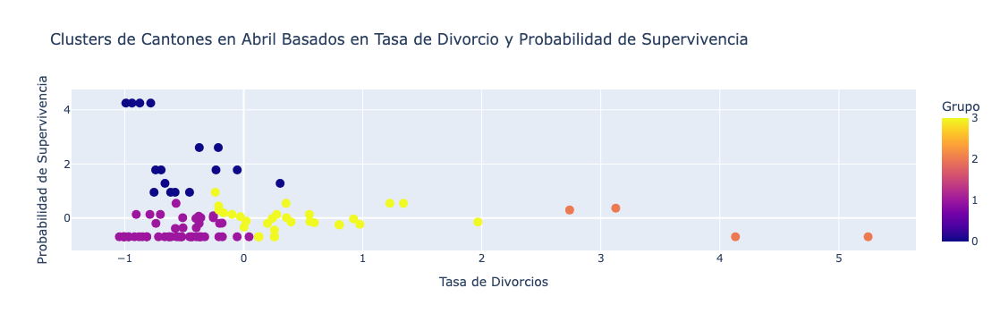

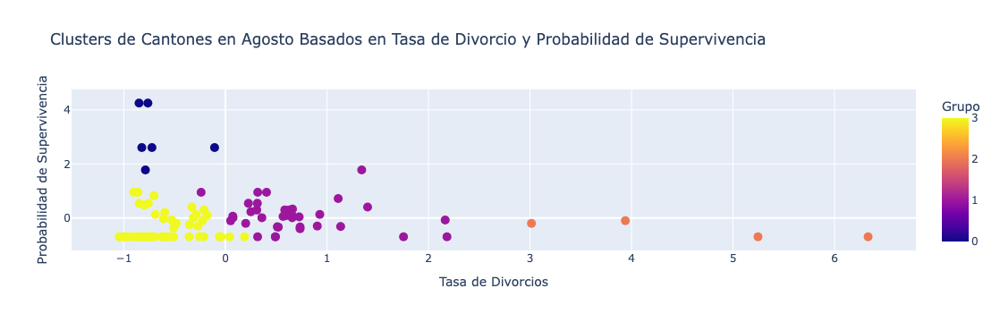

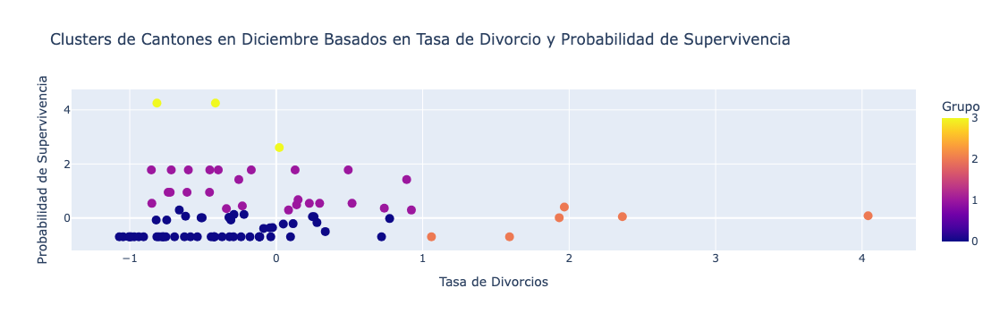

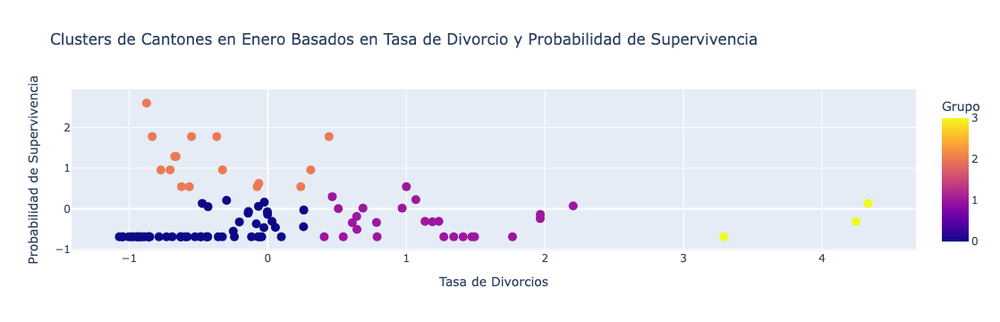

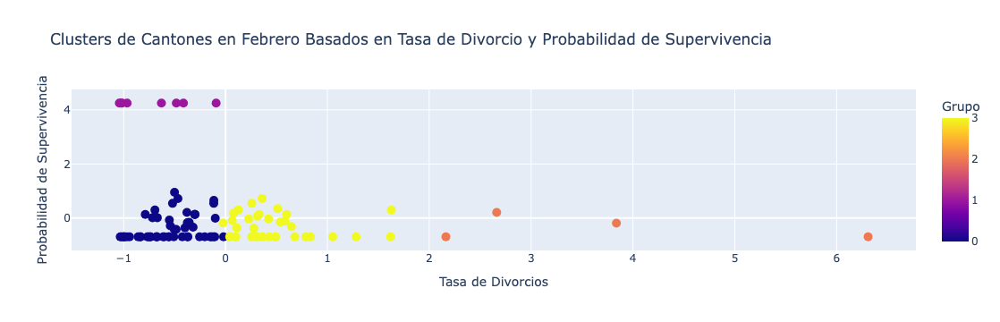

...

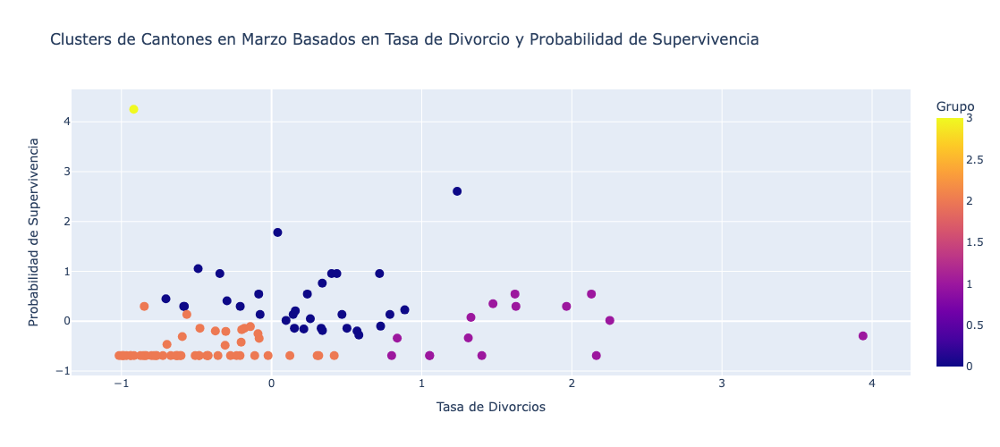

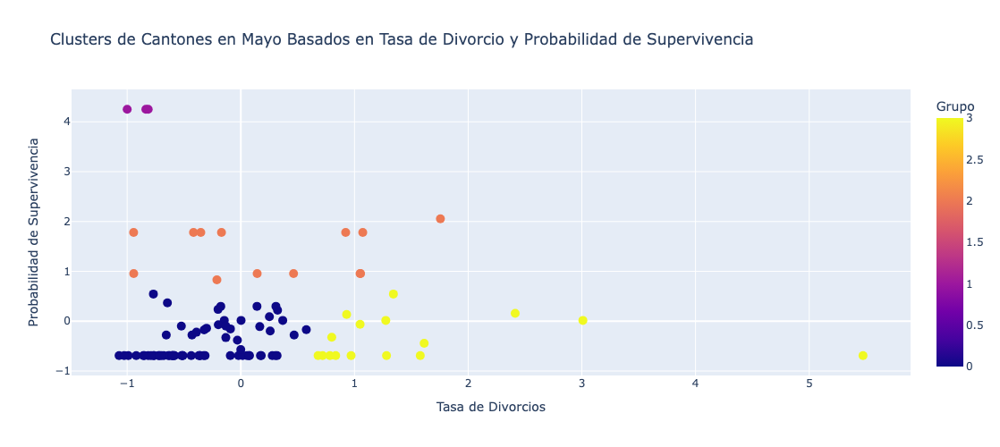

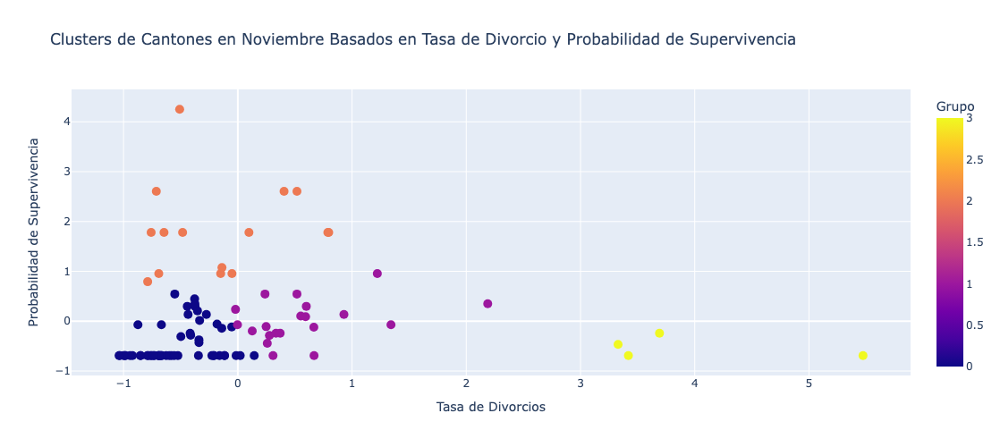

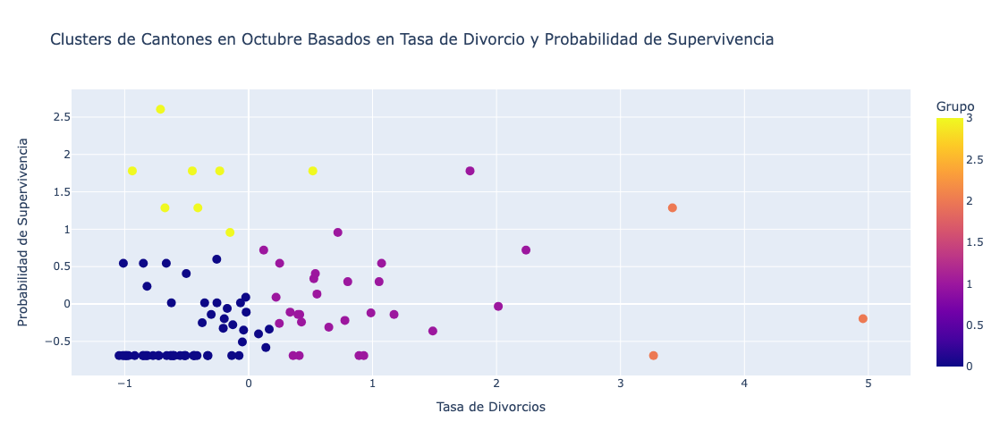

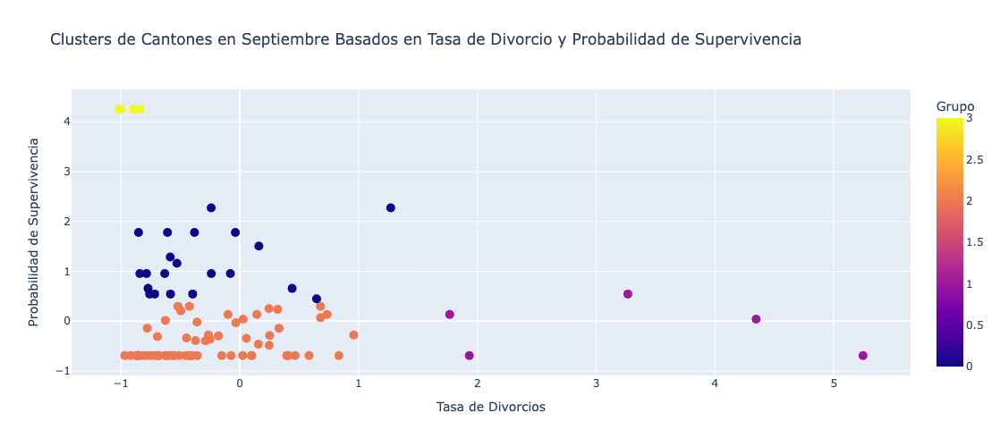

In [53]:
n_clusters = 4

figs = []

mensual = []

for mes in tablaGeneral2_std['Mes'].unique():
    data_mes = tablaGeneral2_std[tablaGeneral2_std['Mes'] == mes].copy()  # Usar .copy() para evitar el warning
    
    X = data_mes[['TasaDiv', 'ProbSupervivencia']]
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    data_mes.loc[:, 'Cluster'] = kmeans.fit_predict(X)  # Usar .loc para modificar la columna

    mensual.append(data_mes)  # Agregar cada DataFrame a la lista mensual
    
    fig = px.scatter(
        data_mes, x='TasaDiv', y='ProbSupervivencia',
        color='Cluster', hover_name='Cantón',
        title=f'Clusters de Cantones en {mes} Basados en Tasa de Divorcio y Probabilidad de Supervivencia',
        labels={
            'TasaDiv': 'Tasa de Divorcios',
            'ProbSupervivencia': 'Probabilidad de Supervivencia',
            'Cluster': 'Grupo'
        }, height=500 
    )
    fig.update_traces(marker=dict(size=10))
    figs.append(fig)

for fig in figs:
    fig.show()


In [54]:
tabla_concatenada = pd.concat(mensual, ignore_index=True)

In [55]:
mes_filtrado = 'Abril'
datos_mes_filtrado = tabla_concatenada[tabla_concatenada['Mes'] == mes_filtrado]

datos_mes_filtrado

,Provincia,Cantón,Total,Mes,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster
0,Azuay,Cuenca,596101,Abril,97,109,-0.741917,0.239255,112.371134,-0.010058,3
1,Azuay,Girón,12182,Abril,8,4,1.848127,1.342099,50.000000,0.545206,3
2,Azuay,Gualaceo,43188,Abril,25,8,1.439986,0.257308,32.000000,-0.689973,3
3,Azuay,Paute,26782,Abril,15,6,1.341483,0.551361,40.000000,0.133480,3
4,Azuay,Santa Isabel,20753,Abril,1,1,-1.342463,-0.781506,100.000000,4.250741,0
...,...,...,...,...,...,...,...,...,...,...,...
93,Orellana,Loreto,27720,Abril,10,1,0.296372,-0.873303,10.000000,4.250741,0
94,Santo Domingo de los Tsáchilas,Santo Domingo,441583,Abril,142,68,0.090944,0.020476,47.887324,-0.108712,3
95,Santo Domingo de los Tsáchilas,La Concordia,51386,Abril,22,2,0.649668,-0.851730,9.090909,-0.689973,1
96,Santa Elena,Santa Elena,186687,Abril,39,6,-0.499777,-0.903134,15.384615,0.133480,1


In [90]:
tablaTrimestres = tabla_concatenada
tablaTrimestres['Trimestre'] = tablaTrimestres['Mes'].map({
    'Enero': '1er Trimestre',
    'Febrero': '1er Trimestre',
    'Marzo': '1er Trimestre',
    'Abril': '2do Trimestre',
    'Mayo': '2do Trimestre',
    'Junio': '2do Trimestre',
    'Julio': '3er Trimestre',
    'Agosto': '3er Trimestre',
    'Septiembre': '3er Trimestre',
    'Octubre': '4to Trimestre',
    'Noviembre': '4to Trimestre',
    'Diciembre': '4to Trimestre'
})
tablaTrimestres

,Provincia,Cantón,Total,Mes,NumMat,NumDiv,TasaMat,TasaDiv,ProporcionDivMat,ProbSupervivencia,Cluster,Trimestre
0,Azuay,Cuenca,596101,Abril,97,109,-0.741917,0.239255,112.371134,-0.010058,3,2do Trimestre
1,Azuay,Girón,12182,Abril,8,4,1.848127,1.342099,50.000000,0.545206,3,2do Trimestre
2,Azuay,Gualaceo,43188,Abril,25,8,1.439986,0.257308,32.000000,-0.689973,3,2do Trimestre
3,Azuay,Paute,26782,Abril,15,6,1.341483,0.551361,40.000000,0.133480,3,2do Trimestre
4,Azuay,Santa Isabel,20753,Abril,1,1,-1.342463,-0.781506,100.000000,4.250741,0,2do Trimestre
...,...,...,...,...,...,...,...,...,...,...,...,...
1157,Orellana,Loreto,27720,Septiembre,4,1,-0.838517,-0.873303,25.000000,-0.689973,2,3er Trimestre
1158,Santo Domingo de los Tsáchilas,Santo Domingo,441583,Septiembre,137,50,0.031576,-0.288494,36.496350,-0.393530,2,3er Trimestre
1159,Santo Domingo de los Tsáchilas,La Concordia,51386,Septiembre,16,2,0.037456,-0.851730,12.500000,-0.689973,2,3er Trimestre
1160,Santa Elena,Santa Elena,186687,Septiembre,58,8,0.033846,-0.821931,13.793103,-0.689973,2,3er Trimestre


## K-MEANS TRIMESTRAL EN 3D

## GRAFICA 3D DEL PRIMER TRIMESTRE

/var/folders/93/17r7mlys3_l2m2vlnzc7n_mr0000gq/T/ipykernel_8506/1940990618.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



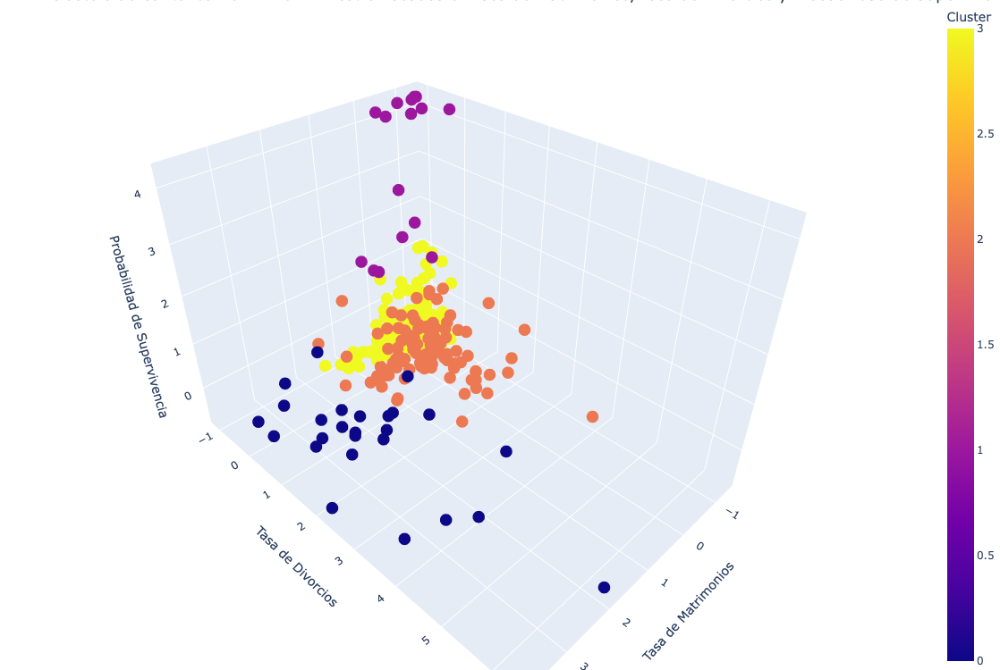

In [92]:
tabla_1er_trimestre = tablaTrimestres[tablaTrimestres['Trimestre'] == '1er Trimestre']
tabla_1er_trimestre

kmeans = KMeans(n_clusters=4, random_state=42)
tabla_1er_trimestre['Cluster'] = kmeans.fit_predict(tabla_1er_trimestre[['TasaMat', 'TasaDiv', 'ProbSupervivencia']])

fig = px.scatter_3d(
    tabla_1er_trimestre,
    x='TasaMat',
    y='TasaDiv',
    z='ProbSupervivencia',
    color='Cluster',
    hover_name='Cantón',
    title='Clusters de Cantones Del Primer Trimestre Basados en Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia',
    labels={'TasaMat': 'Tasa de Matrimonios', 'TasaDiv': 'Tasa de Divorcios', 'ProbSupervivencia': 'Probabilidad de Supervivencia'}
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

## GRAFICA 3D DEL SEGUNDO TRIMESTRE

/var/folders/93/17r7mlys3_l2m2vlnzc7n_mr0000gq/T/ipykernel_8506/861004028.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



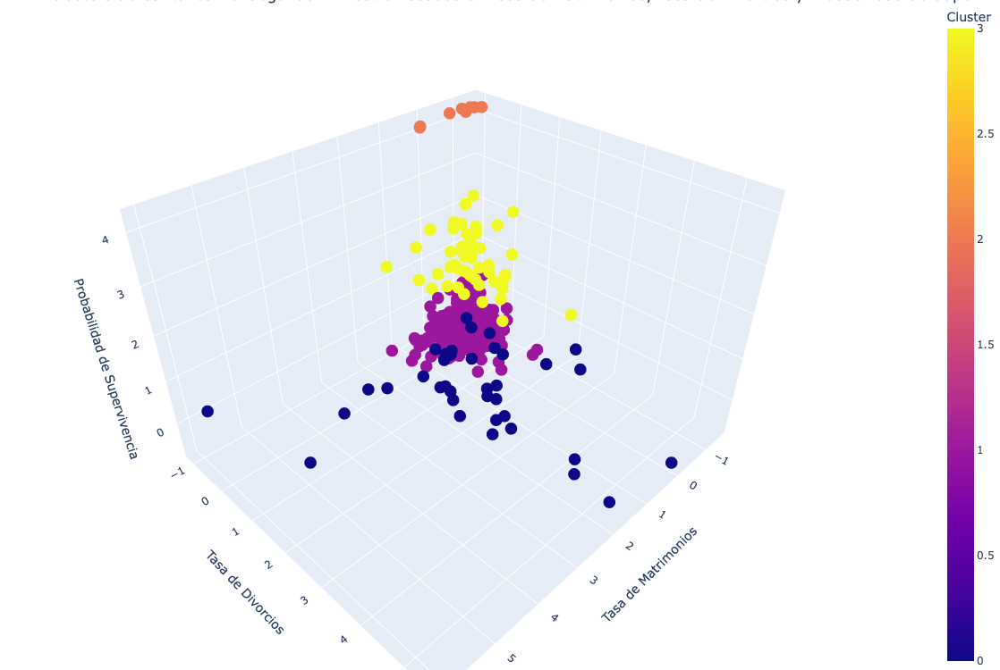

In [93]:
tabla_2do_trimestre = tablaTrimestres[tablaTrimestres['Trimestre'] == '2do Trimestre']
tabla_2do_trimestre

kmeans = KMeans(n_clusters=4, random_state=42)
tabla_2do_trimestre['Cluster'] = kmeans.fit_predict(tabla_2do_trimestre[['TasaMat', 'TasaDiv', 'ProbSupervivencia']])

fig = px.scatter_3d(
    tabla_2do_trimestre,
    x='TasaMat',
    y='TasaDiv',
    z='ProbSupervivencia',
    color='Cluster',
    hover_name='Cantón',
    title='Clusters de Cantones Del Segundo Trimestre Basados en Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia',
    labels={'TasaMat': 'Tasa de Matrimonios', 'TasaDiv': 'Tasa de Divorcios', 'ProbSupervivencia': 'Probabilidad de Supervivencia'}
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

## GRAFICA 3D DEL TERCER TRIMESTRE

/var/folders/93/17r7mlys3_l2m2vlnzc7n_mr0000gq/T/ipykernel_8506/545690380.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



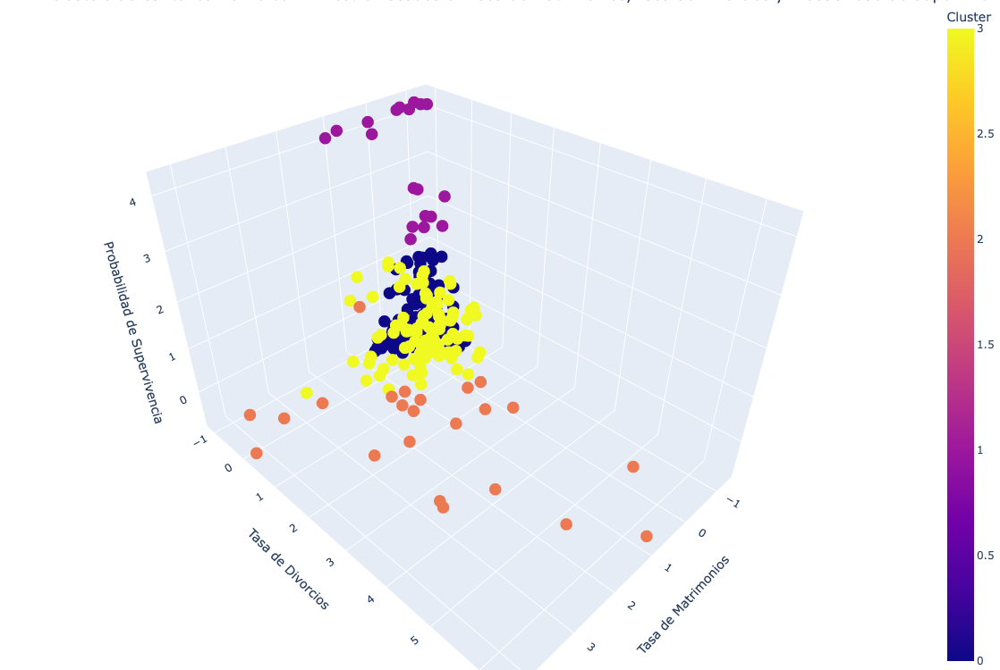

In [94]:
tabla_3er_trimestre = tablaTrimestres[tablaTrimestres['Trimestre'] == '3er Trimestre']
tabla_3er_trimestre

kmeans = KMeans(n_clusters=4, random_state=42)
tabla_3er_trimestre['Cluster'] = kmeans.fit_predict(tabla_3er_trimestre[['TasaMat', 'TasaDiv', 'ProbSupervivencia']])

fig = px.scatter_3d(
    tabla_3er_trimestre,
    x='TasaMat',
    y='TasaDiv',
    z='ProbSupervivencia',
    color='Cluster',
    hover_name='Cantón',
    title='Clusters de Cantones Del Tercer Trimestre Basados en Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia',
    labels={'TasaMat': 'Tasa de Matrimonios', 'TasaDiv': 'Tasa de Divorcios', 'ProbSupervivencia': 'Probabilidad de Supervivencia'}
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

## GRAFICA 3D DEL CUARTO TRIMESTRE

/var/folders/93/17r7mlys3_l2m2vlnzc7n_mr0000gq/T/ipykernel_8506/1875978050.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



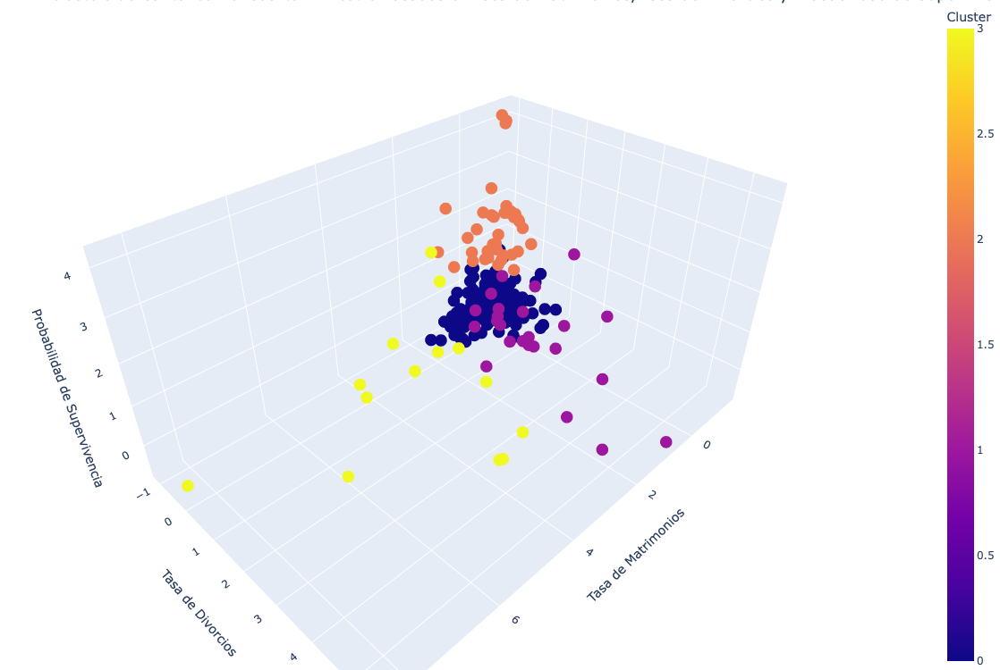

In [95]:
tabla_4to_trimestre = tablaTrimestres[tablaTrimestres['Trimestre'] == '4to Trimestre']
tabla_4to_trimestre

kmeans = KMeans(n_clusters=4, random_state=42)
tabla_4to_trimestre['Cluster'] = kmeans.fit_predict(tabla_4to_trimestre[['TasaMat', 'TasaDiv', 'ProbSupervivencia']])

fig = px.scatter_3d(
    tabla_4to_trimestre,
    x='TasaMat',
    y='TasaDiv',
    z='ProbSupervivencia',
    color='Cluster',
    hover_name='Cantón',
    title='Clusters de Cantones Del Cuarto Trimestre Basados en Tasa de Matrimonios, Tasa de Divorcios y Probabilidad de Supervivencia',
    labels={'TasaMat': 'Tasa de Matrimonios', 'TasaDiv': 'Tasa de Divorcios', 'ProbSupervivencia': 'Probabilidad de Supervivencia'}
)

fig.update_layout(
    scene=dict(
        xaxis_title='Tasa de Matrimonios',
        yaxis_title='Tasa de Divorcios',
        zaxis_title='Probabilidad de Supervivencia'
    ),
    autosize=False,
    width=1200,
    height=750,
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

In [96]:
tabla_trimestral = tablaTrimestres.groupby(['Provincia', 'Trimestre']).agg({
    'TasaMat': 'mean',
    'TasaDiv': 'mean',
    'ProbSupervivencia': 'mean'
}).reset_index()
tabla_trimestral

,Provincia,Trimestre,TasaMat,TasaDiv,ProbSupervivencia
0,Azuay,1er Trimestre,0.864265,0.751282,-0.505279
1,Azuay,2do Trimestre,0.184269,0.417499,0.340784
2,Azuay,3er Trimestre,0.281685,0.808727,-0.094980
3,Azuay,4to Trimestre,0.023323,0.298879,0.387737
4,Bolívar,1er Trimestre,-0.486749,0.032826,0.274019
...,...,...,...,...,...
91,Tungurahua,4to Trimestre,0.089915,0.072316,-0.153871
92,Zamora Chinchipe,1er Trimestre,0.168211,0.180176,1.162795
93,Zamora Chinchipe,2do Trimestre,0.016876,1.037597,0.027607
94,Zamora Chinchipe,3er Trimestre,-0.122448,-0.341901,0.545206


## TABLAS DE PROVINCIAS MAS RELEVANTES

In [98]:
provincias_interes = ['Azuay', 'Guayas', 'Pichincha', 'Galápagos', 'Zamora Chinchipe', 'Esmeraldas']

comparaciones = [
    ('1er Trimestre', '2do Trimestre'),
    ('1er Trimestre', '3er Trimestre'),
    ('1er Trimestre', '4to Trimestre')
]

resultados = {}

for (trimestre_inicio, trimestre_fin) in comparaciones:
    filtro_trimestres = tabla_trimestral[
        (tabla_trimestral['Provincia'].isin(provincias_interes)) & 
        (tabla_trimestral['Trimestre'].isin([trimestre_inicio, trimestre_fin]))
    ]

    # Pivotar la tabla para los trimestres
    tabla_pivot_provincias = filtro_trimestres.pivot_table(
        index='Provincia', 
        columns='Trimestre', 
        values=['ProbSupervivencia', 'TasaMat', 'TasaDiv']
    ).reset_index()

    # Calcular el cambio en la probabilidad de supervivencia
    tabla_pivot_provincias['Cambio_ProbSupervivencia'] = (
        tabla_pivot_provincias[('ProbSupervivencia', trimestre_fin)] - 
        tabla_pivot_provincias[('ProbSupervivencia', trimestre_inicio)]
    )

    # Seleccionar y renombrar las columnas necesarias
    tabla_pivot_provincias.columns = [
        'Provincia', 
        'ProbSupervivencia_1er', f'ProbSupervivencia_{trimestre_fin.split()[0]}',
        'TasaMat_1er', f'TasaMat_{trimestre_fin.split()[0]}',
        'TasaDiv_1er', f'TasaDiv_{trimestre_fin.split()[0]}',
        'Cambio_ProbSupervivencia'
    ]

    # Guardar el resultado para este par de trimestres
    resultados[trimestre_fin] = tabla_pivot_provincias

# Mostrar los resultados de la comparación entre el primer y cuarto trimestre
# Se pueden ver los datos con resultados['2do Trimestre'] y resultados['3er Trimestre']
resultados['4to Trimestre']

,Provincia,ProbSupervivencia_1er,ProbSupervivencia_4to,TasaMat_1er,TasaMat_4to,TasaDiv_1er,TasaDiv_4to,Cambio_ProbSupervivencia
0,Azuay,-0.505279,0.387737,0.751282,0.298879,0.864265,0.023323,0.893016
1,Esmeraldas,-0.184138,-0.190623,-0.749071,-0.775274,-0.698736,-0.623615,-0.006485
2,Galápagos,-0.572337,-0.003406,2.097826,2.517966,1.680738,2.804086,0.568931
3,Guayas,-0.014883,0.029471,-0.583604,-0.501286,-0.384975,0.093586,0.044354
4,Pichincha,-0.276286,0.241055,0.359549,0.143069,0.974615,1.120795,0.517341
5,Zamora Chinchipe,1.162795,0.545206,0.180176,0.616615,0.168211,-0.677234,-0.617589


In [99]:
tabla_pivot = tabla_trimestral.pivot_table(
    index='Provincia', 
    columns='Trimestre', 
    values=['TasaMat', 'TasaDiv', 'ProbSupervivencia']
).reset_index()

tabla_pivot.columns = [
    'Provincia', 
    'Tasa Mat 1er Trimestre', 'Tasa Div 1er Trimestre', 'Prob Sup 1er Trimestre',
    'Tasa Mat 2do Trimestre', 'Tasa Div 2do Trimestre', 'Prob Sup 2do Trimestre',
    'Tasa Mat 3er Trimestre', 'Tasa Div 3er Trimestre', 'Prob Sup 3er Trimestre',
    'Tasa Mat 4to Trimestre', 'Tasa Div 4to Trimestre', 'Prob Sup 4to Trimestre'
]

tabla_pivot

,Provincia,Tasa Mat 1er Trimestre,Tasa Div 1er Trimestre,Prob Sup 1er Trimestre,Tasa Mat 2do Trimestre,Tasa Div 2do Trimestre,Prob Sup 2do Trimestre,Tasa Mat 3er Trimestre,Tasa Div 3er Trimestre,Prob Sup 3er Trimestre,Tasa Mat 4to Trimestre,Tasa Div 4to Trimestre,Prob Sup 4to Trimestre
0,Azuay,-0.505279,0.340784,-0.094980,0.387737,0.751282,0.417499,0.808727,0.298879,0.864265,0.184269,0.281685,0.023323
1,Bolívar,0.274019,0.373223,0.426263,0.206022,0.032826,0.012197,-0.117478,-0.184789,-0.486749,-0.756131,-0.424222,-0.398062
2,Carchi,-0.308745,-0.327838,0.531552,0.197807,0.601237,0.274491,1.005622,0.889163,0.179889,0.106245,1.001168,-0.019578
3,Cañar,-0.265874,0.109952,0.015146,-0.192085,4.007141,2.820391,4.074955,4.108862,2.955109,2.298376,2.884744,2.439104
4,Chimborazo,-0.230532,0.058970,-0.170504,-0.297194,-0.077561,0.369836,0.528727,0.315661,-0.208422,0.125171,0.287396,0.153410
5,Cotopaxi,-0.324132,0.482140,0.670714,-0.346780,-0.498020,-0.544957,-0.589822,-0.594562,0.532728,0.494841,0.395743,0.050190
6,El Oro,-0.159337,-0.028714,-0.273377,-0.333127,0.021090,0.357046,0.080035,0.315091,0.160472,-0.153530,-0.053666,0.014935
7,Esmeraldas,-0.184138,0.831479,0.291433,-0.190623,-0.749071,-0.706722,-0.691460,-0.775274,-0.698736,-0.617279,-0.796960,-0.623615
8,Galápagos,-0.572337,-0.107674,-0.552731,-0.003406,2.097826,2.834946,3.335522,2.517966,1.680738,1.921266,1.080421,2.804086
9,Guayas,-0.014883,-0.029351,0.088868,0.029471,-0.583604,-0.300403,-0.490997,-0.501286,-0.384975,-0.417127,-0.358602,0.093586
